<a href="https://colab.research.google.com/github/thself/Thself1/blob/main/Pick_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive, files
import sys
import os
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
from bs4 import BeautifulSoup
from pprint import pprint
from datetime import datetime
import requests
import numpy as np
#Thus in normal people in a waking state excitation in the organ of ideation does not pass over to the organs of perception: such people do not hallucinate.
#Modelling as the organ of ideation passing over to the organs of perception
#CONSIDER: difference is always absolute subtraction from the uniform distribution
#https://www.lottery.co.uk/pick-3/results/archive-2020
#https://www.lottery.co.uk/pick-3/results/archive-2021
#https://www.lottery.co.uk/pick-3/results/archive-2022
#https://www.lottery.co.uk/pick-3/results/archive-2023
#TODO: model commitments (for testifier) e.g. commiting to keeping data together from first draw.
#TODO: p by p matrix for sequences
n=10
p=3
group_size = 2
DN = []
tempProgress = False
tempProgress1 = False
for i in range(5): #CONSIDER, this is known information from the website data; to connect to their models.
    dn = []
    url = f'https://www.lottery.co.uk/pick-3/results/archive-202{i}'
    ind=0
    r = requests.get(url)
    nurl=r.text
    #pprint(nurl)

    #with open(f"/content/drive/MyDrive/sites/Free Lottery Results{i}.html") as fp:
    soup = BeautifulSoup(nurl, 'html.parser')
    #x=soup.find_all(["td"], class_=["centred colour noBefore", "result small pick-3 number-part-01 inline ball"])
    #pprint(f"x:{x}")
    text = soup.get_text('\n', strip=True)
    text=list(text.split("\n"))
    #pprint(f"text:{text}")
    if i == 0:
        an = text.index('6pm Result')
        day = 8
        progress = day
        rcountcheck = 2
    else:
        an = text.index('9pm Result')
        day = 11
        progress = day
        rcountcheck = 3
    bn = text.index('Pick 3 Results Archive Years')
    #pprint(f"bn:{bn}")
    #pprint(len(text))
    text = text[an+1:]
    #pprint(f"text:{text}")
    #pprint(f"text[44]:{text[44]}")
    #'Pick 3 Results Archive Years' '9pm Result'
    while True:
        try:
            d=[]
            nn=[]
            one=[]
            #pprint(f"text[ind{ind}+1:{i}]:{text[ind+1]}")
            #if text[ind+1] == '1st August 2023': ind+=9
            if text[ind+1] == '8th June 2021':
                day = 9
                progress = day
                rcountcheck = 2
            for i in range(day):
                #pprint(f"text[ind{ind}+i:{i}]:{text[ind+i]}")
                if i < 2:
                    d.append(text[ind+i])
                else:
                    if text[ind+i] == "-":
                        continue
                    if text[ind+i] == "The 6pm results have":
                        tempProgress = True
                        break
                    if text[ind+i] == "The 9pm results have":
                        tempProgress1 = True
                        break
                    nn.append(int(text[ind+i]))
            if tempProgress == True:
                ind+=9
                tempProgress = False
            elif tempProgress1 == True:
                ind+=10
                tempProgress1 = False
            else:
                ind+=progress
            #pprint(f"d:{d}")
            dd=" ".join([d[1].split(" ")[0][:-2], d[1].split(" ")[1], d[1].split(" ")[2]]) # + " " + d[3] #" ".join(i)
            dd=datetime.strptime(dd, '%d %B %Y')
            d=dd.strftime('%Y-%m-%d')
            two=[]
            rcount=0
            ress = []
            for res in list(reversed(nn)):
                #print("for res in nn:")
                ress.append(res)
                rcount += 1
                if rcount == 3:
                    #pprint(f"[ress, d]:{[ress, d]}")
                    ress = list(reversed(ress))
                    dn.append([ress, d])
                    #print(f"ress:{ress}")
                    ress = []
                    rcount = 0
                #print(f"rcount:{rcount}")
            #one.append(two)
            #one.append(nn)
            #one.append(d)
            #dn.append(one)
            #dn.append(two)
            #pprint(f"one:{one}")
            if ind >= text.index('Pick 3 Results Archive Years'):
                break
        except Exception as e:
                print(e)
                raise
                break
    DN.extend(reversed(dn))
D = [dn[1] for dn in DN]
print(f"len(DN):{len(DN)}")
print(f"len(D):{len(D)}")
pprint(f"D:{D}", width=4444444444444444444444444444444444444444444444444)
from collections import defaultdict, OrderedDict

def mark_consecutive_repeats(dates):
    #date_count = defaultdict(int)
    marked_dates = [] #'2020-07-14.1', '2020-07-14']
    previousDate = None
    dateGroup = []
    for datex, date in enumerate(dates):
        if date == previousDate:
            #if date == '2023-09-15':
            #print(f"datex:{datex} if date:{date} == previousDate:{previousDate}:")
            if len(dateGroup) < 2:
                dateGroup.append(date)
                dateGroup.append(previousDate)
            else:
                dateGroup.append(date)
        if date not in dateGroup and len(dateGroup) > 0:
            #if date == '2023-09-15':
                #pprint(f"datex:{datex} if date:{date} not in dateGroup:{dateGroup}:", width=444444444444444444444444444444)
            #alist = []
            for dx, datee in enumerate(dateGroup):
                #if date == '2023-09-15':
                    #pprint(f"datex:{datex} (for dx:{dx}, datee:{datee} in enumerate(dateGroup):)")
                if dx == 0:
                    date_count = ""
                else:
                    date_count = "." + f"{dx}"
                #if date == '2023-09-15':
                    #pprint(f'datex:{datex} alist.append(f"datee:{datee}date_count:{date_count}")')
                marked_dates.append(f"{datee}{date_count}")
            #for j in list(reversed(alist)):
            #    marked_dates.append(j)
            dateGroup = []
        if datex == len(dates)-1: dateGroup.append(date)
        previousDate = date
        """if date_count[date] > 0:
            marked_dates.append(f"{date}.{date_count[date]}")
            date_count[date] += 1
        else:
            marked_dates.append(date)
            date_count[date] = 1"""
    #if date not in marked_dates:
    #    marked_dates.append(date)
    if len(dateGroup) > 0:
        #alist = []
        for dx, datee in enumerate(dateGroup):
            #pprint(f"datex:{datex} (for dx:{dx}, datee:{datee} in enumerate(dateGroup:{dateGroup}):)")
            if dx == 0:
                date_count = ""
            else:
                date_count = "." + f"{dx}"
            #pprint(f"datex:{datex} marked_dates.append(f'{datee}{date_count}')")
            marked_dates.append(f"{datee}{date_count}")
        #for j in list(reversed(alist)):
        #    marked_dates.append(j)
    return marked_dates

# Modify the list of dates with consecutive repeats marked
modified_dates = mark_consecutive_repeats(D)
pprint(f"len(modified_dates):{len(modified_dates)}")
pprint(f"len(DN):{len(DN)}")
print(f"modified_dates[658:658+4+4+4+4]:{modified_dates[658:658+4+4+4+4]}")
print(f"modified_dates:{modified_dates}")
print(f"D:{D}")
#from itertools import zip_longest
#for j in zip_longest(modified_dates,D):
#    pprint(f"{j}")
print(f"DN:{DN}")
print(f"D[658:658+4+4+4+4]:{D[658:658+4+4+4+4]}")
"""for dx, d in enumerate(modified_dates):
    if d.split(".")[0] != D[dx]:
        print(f"dx:{dx} D[dx]:{D[dx]}")"""

Ns1=[dn[0] for dn in DN]
#print(Ns)
Ns = [[(dx,nn) for dx,nn in enumerate(nnn)] for nnn in Ns1]
#print(Ns)
keydt = {0:"A",1:"B",2:"C"}
keydt1 = {"A":0,"B":1,"C":2}
Ns = [["".join([keydt[nx],str(nn)])for nx,nn in nnn]for nnn in Ns]
print(Ns) #ordered wrong here
pprint(f"len(modified_dates):{len(modified_dates)}")
pprint(f"len(DN):{len(DN)}")
DN = [[dn[0], modified_dates[dx]] for dx, dn in enumerate(DN)]
pprint(f"DN[-1]:{DN[-1]} dn[-1]:{dn[-1]} modified_dates[-1]:{modified_dates[-1]}")
pprint(f"len(DN):{len(DN)} len(dn):{len(dn)} len(modified_dates):{len(modified_dates)}")
pprint(f"DN:{DN}") #marked up wrong here
pprint(f"len(DN):{len(DN)}")
#DN = [[(Ns[dx],dn[0]), modified_dates[dx]] for dx, dn in enumerate(DN)]
#pprint(f"DN:{DN}")
#pprint(f"len(DN):{len(DN)}")
#Ns2 = set([str(i) for i in Ns1])
#Ns2 = [list(i) for i in Ns2]
print(f"Ns1:{Ns1}")
Ns2 = []
Ns3 = []
for i in Ns1:
    #pprint(i)
    #pprint(type(i))
    Ns2.append(i[:2])
    Ns2.append(i[1:])
    for j in i:
        Ns3.append(j)
print(f"Ns3:{Ns3}")
Ns3U=Ns3[-10002:]
Ns3check=Ns3[-10002-3:]
Ns3check=Ns3check[:6]
Ns3=Ns3[:-10002]
print(f"Ns2:{Ns2}")
print(f"Ns3:{Ns3}")
print(f"rev Ns3:{list(reversed(Ns3))}")
print(f"rev DN[:-3334]:{list(reversed(DN[:-3334]))}")
print(f"Ns3U:{Ns3U}")
print(f"rev Ns3U:{list(reversed(Ns3U))}")
print(Ns3check)
#Ns3U = Ns3[-15:]
#Ns3 = Ns3[:-15]
#print(set([int("".join([str(j) for j in i])) for i in Ns1]))
print(f"len(set([str(i) for i in Ns1])):{len(set([str(i) for i in Ns1]))}")
print(f"len(set([str(i) for i in Ns2])):{len(set([str(i) for i in Ns2]))}")
#set([next(iter(set([nnn in yl for nnn in nn]))) for nn in Ns]) #<-- IMPORTANT ### checks if winning_numbers match element_set (yl) ###
#The jealous branch family who thinks they can do a better job is ruining the A.I.
#Monthly system restructuring coming to an A.I. system near you.
import lzma
import gzip
import pickle
from datetime import datetime
def load_data(filename):
    #with gzip.open(filename, 'rb') as f:
    with lzma.open(filename, 'rb') as f:
        return pickle.load(f)
def store_data(data, filename):
    #with gzip.open(filename, 'wt') as f:
    with lzma.open(filename, 'wb') as f:
        pickle.dump(data, f)
#print(Ns1)
Ns11= defaultdict(list)
for ix, i in enumerate(Ns1):
    Ns11[ix] = i
print(f"Ns11:{Ns11}")
#store_data(Ns11,'/content/drive/MyDrive/lotterydraws/pick3.pkl.xz')
print(f"len(Ns3):{len(Ns3)}")
#print(f"Ns3[10826]:{Ns3[10826]}")
#print(f"Ns3[10827]:{Ns3[10827]}")
#print(f"Ns3[10828]:{Ns3[10828]}")
#store_data(winningNumbers(WiNs)[1],'/content/drive/MyDrive/Thunderball/thunder.pkl.xz')

len(DN):3630
len(D):3630
"D:['2020-07-14', '2020-07-14', '2020-07-15', '2020-07-15', '2020-07-16', '2020-07-16', '2020-07-17', '2020-07-17', '2020-07-18', '2020-07-18', '2020-07-19', '2020-07-19', '2020-07-20', '2020-07-20', '2020-07-21', '2020-07-21', '2020-07-22', '2020-07-22', '2020-07-23', '2020-07-23', '2020-07-24', '2020-07-24', '2020-07-25', '2020-07-25', '2020-07-26', '2020-07-26', '2020-07-27', '2020-07-27', '2020-07-28', '2020-07-28', '2020-07-29', '2020-07-29', '2020-07-30', '2020-07-30', '2020-07-31', '2020-07-31', '2020-08-01', '2020-08-01', '2020-08-02', '2020-08-02', '2020-08-03', '2020-08-03', '2020-08-04', '2020-08-04', '2020-08-05', '2020-08-05', '2020-08-06', '2020-08-06', '2020-08-07', '2020-08-07', '2020-08-08', '2020-08-08', '2020-08-09', '2020-08-09', '2020-08-10', '2020-08-10', '2020-08-11', '2020-08-11', '2020-08-12', '2020-08-12', '2020-08-13', '2020-08-13', '2020-08-14', '2020-08-14', '2020-08-15', '2020-08-15', '2020-08-16', '2020-08-16', '2020-08-17', '2020

In [ ]:
from collections import defaultdict
print(Ns3) #contains draws up to a point in time
print(list(reversed(Ns3)))
#print(Ns3U) #contains later draws
#[1, 4, 0, 1, 4, 5, 2, 9, 2, 6,
#[4, 3, 4, 0, 3, 2, 4, 4, 8]
def ddfalse():
    return False
confidenceLatestWN = Ns3[-1]
conflictedFirstIndex = {}
conflictedFirstIndexDone = defaultdict(ddfalse)
for ix, i in enumerate(Ns3[:-1]):
    if i == confidenceLatestWN and conflictedFirstIndexDone[i] == False:
        conflictedFirstIndexDone[i] = True
        confidence = ix
        break
print(confidence)
for i
conflicted =
#TODO 1120 variableGroups for popundarance of evidence.

[7, 8, 3, 7, 5, 3, 4, 5, 0, 5, 6, 1, 1, 5, 0, 3, 6, 8, 8, 5, 2, 2, 4, 4, 4, 8, 1, 4, 4, 0, 4, 5, 6, 7, 9, 4, 0, 9, 4, 4, 9, 0, 5, 9, 2, 2, 5, 1, 4, 7, 0, 7, 0, 5, 0, 9, 2, 9, 7, 0, 5, 7, 2, 4, 3, 6, 3, 9, 9, 6, 8, 6, 9, 1, 1, 0, 3, 1, 6, 9, 8, 8, 4, 5, 3, 3, 8, 7, 3, 8, 5, 5, 2, 1, 3, 1, 7, 3, 9, 9, 6, 2, 5, 3, 3, 7, 0, 7, 7, 7, 6, 7, 6, 7, 4, 5, 0, 2, 4, 1, 5, 8, 3, 0, 6, 3, 3, 4, 1, 2, 1, 1, 5, 0, 8, 5, 3, 4, 1, 2, 0, 7, 6, 8, 6, 4, 4, 2, 9, 1, 5, 1, 0, 4, 9, 0, 4, 0, 3, 8, 2, 7, 5, 6, 8, 4, 8, 0, 3, 3, 8, 7, 6, 5, 2, 3, 0, 5, 9, 9, 2, 0, 0, 9, 0, 8, 0, 4, 3, 3, 1, 2, 7, 6, 2, 8, 0, 6, 7, 4, 2, 1, 6, 2, 4, 2, 6, 9, 8, 8, 9, 0, 5, 8, 2, 3, 9, 9, 8, 8, 4, 1, 8, 5, 1, 8, 6, 0, 7, 7, 7, 6, 5, 0, 1, 5, 6, 7, 3, 0, 8, 5, 4, 3, 3, 3, 7, 2, 6, 0, 6, 5, 5, 7, 9, 0, 3, 1, 5, 7, 8, 1, 8, 3, 9, 2, 4, 8, 0, 9, 7, 9, 5, 1, 6, 9, 6, 2, 8, 1, 9, 7, 0, 9, 3, 8, 2, 2, 3, 5, 9, 0, 3, 3, 0, 0, 4, 0, 4, 7, 5, 6, 4, 0, 6, 9, 7, 5, 3, 0, 9, 5, 6, 6, 6, 1, 3, 1, 4, 5, 9, 0, 8, 9, 5, 7, 1, 7, 2, 7, 6, 8, 6, 

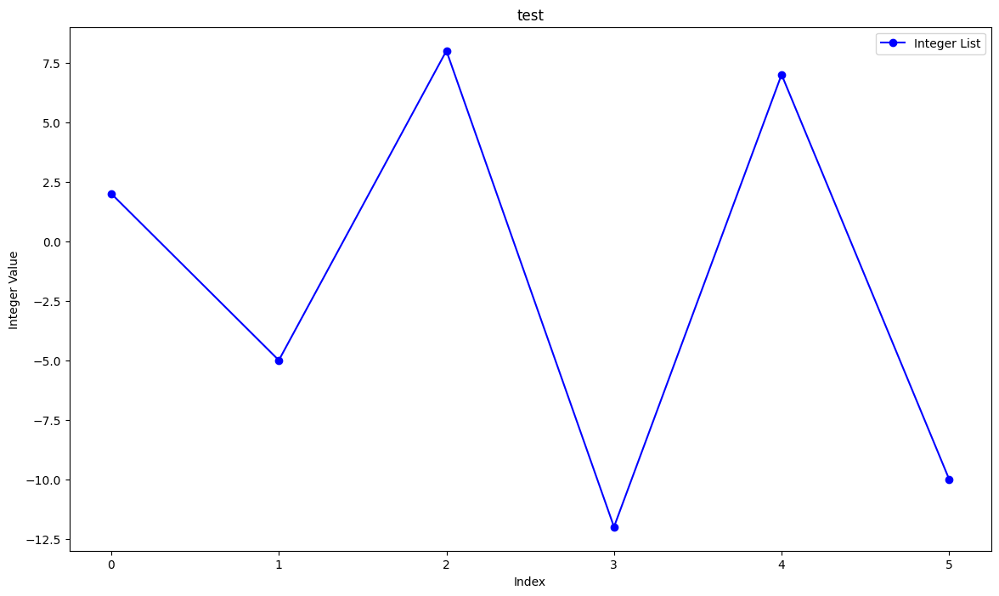

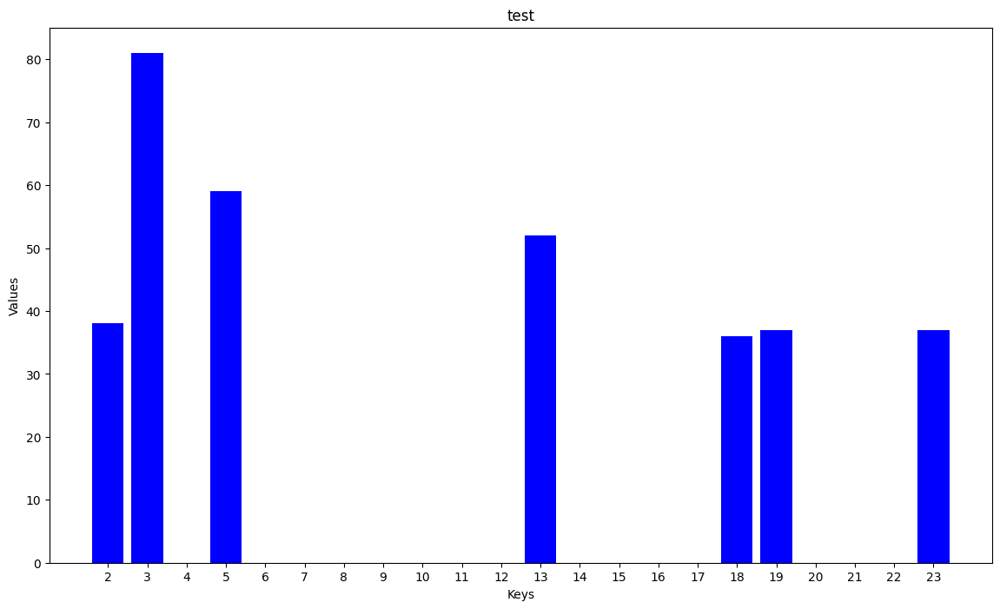

In [ ]:
#@title Plotting
import matplotlib.pyplot as plt

# Example list of positive and negative integers
integer_list = [2, -5, 8, -12, 7, -10]
def doplot(integer_list, title):

    # Set the figure size and dpi
    fig, ax = plt.subplots(figsize=(14, 8), dpi=100)

    # Plotting the list of integers
    ax.plot(integer_list, marker='o', linestyle='-', color='b', label='Integer List')

    # Adding labels and title
    ax.set_xlabel('Index')
    ax.set_ylabel('Integer Value')
    ax.set_title(title)

    # Display the legend
    ax.legend()

    # Show the plot
    plt.show()
def doplot1(indices, x_values, y_values, title):


    # Given integer values for x-axis
    indices = np.array(indices)

    # Given two sets of values for the y-axis
    values_set1 = np.array(x_values)
    values_set2 = np.array(y_values)
    # Set the width of the bars
    bar_width = 0.35

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(18, 12), dpi=100)

    # Plot the first set of bars
    ax.bar(indices - bar_width/2, values_set1, bar_width, label='Delay')

    # Plot the second set of bars
    ax.bar(indices + bar_width/2, values_set2, bar_width, label='Numbers')

    # Adding labels and title
    ax.set_xlabel('Delay Index')
    ax.set_ylabel('Number Values')
    ax.set_title(title)

    # Add grid
    ax.grid(True, linestyle='--', alpha=0.7)

    # Increase y-axis tick resolution
    ax.yaxis.set_major_locator(MultipleLocator(1))  # Set major ticks every 5 units
    ax.yaxis.set_minor_locator(MultipleLocator(1))  # Set minor ticks every 1 unit

    ax.legend()  # Add legend to distinguish sets

    # Display the plot
    plt.show()
import matplotlib.pyplot as plt

data = {3: 81, 5: 59, 13: 52, 2: 38, 19: 37, 23: 37, 18: 36}

# Extract keys and values
keys = list(data.keys())
values = list(data.values())

def doplot2(keys, values, title):
    plt.figure(figsize=(14, 8))
    plt.bar(keys, values, color='blue')
    plt.xlabel('Keys')
    plt.ylabel('Values')
    plt.title(title)
    # Setting ticks for every 1 value
    plt.xticks(range(min(keys), max(keys) + 1, 1))
    plt.show()

doplot(integer_list, 'test')
doplot2(keys, values, 'test')


In [ ]:
#@title Template Maker
def generate_partitions_with_colors(n, group_size, zero, extra,nExclusive):
    """
    Generate all partitions for the numbers of Sn and assign colors to each group of numbers.

    Args:
        n (int): The maximum number in the set Sn.
        group_size (int): The size of each group of numbers.

    Returns:
        dict: Dictionary mapping group numbers to corresponding numbers in each group.
        dict: Dictionary mapping numbers to their assigned colors.
    """
    partitions = {}
    colors = {}

    print(f"for i in range(n // group_size:{n // group_size}):")
    for i in range(n // group_size):
        group_numbers = list(range(i * group_size, (i + 1) * group_size))
        if zero == True:
            pass
        else:
            if 0 in group_numbers:
                group_numbers.remove(0)
        partitions[i] = group_numbers
        colors.update({number: i for number in group_numbers})

    # Include the last group automatically handling the case when n is not divisible by group_size
    if zero == True:
        pass
    if extra == True:
        #print(f"group_numbers = list(range((n // group_size) * group_size:{(n // group_size) * group_size}, n + 1:{n + 1}))")
        group_numbers = list(range((n // group_size) * group_size, n + 1))
        if nExclusive == True:
            group_numbers.remove(n)
        partitions[n // group_size] = group_numbers
        colors.update({number: n // group_size for number in group_numbers})

    return partitions, colors


def apply_coloring_function(numbers, coloring_function):
    """
    Apply coloring function to a list of numbers.

    Args:
        numbers (list): List of numbers.
        coloring_function (dict): Dictionary mapping numbers to their assigned colors.

    Returns:
        tuple: Tuple of numbers with applied coloring.
    """
    converted_numbers = []
    for num in numbers:
        #if isinstance(coloring_function[num], list):

        if num in coloring_function:
            color = coloring_function[num]
            converted_numbers.append(color)
        else:
            raise ValueError(f"No color found for number: {num}")
    return tuple(converted_numbers)
rationPartitions = []
print(Ns3)
partitions, colorsa = generate_partitions_with_colors(n, group_size, True, False, False)
print(partitions)
print(f"colorsa:{colorsa}")
template = [apply_coloring_function(r, colorsa) for r in Ns1]
print(template)
Ns3a = [item for sublist in template for item in sublist]
print(Ns3a)
print()
partitions, colorsb = generate_partitions_with_colors(n, group_size+1, True, True, True)
print(partitions)
print(f"colorsb:{colorsb}")
template1 = [apply_coloring_function(r, colorsb) for r in Ns1]
print(template1)
Ns3b = [item for sublist in template1 for item in sublist]
print(Ns3b)
print()
partitions, colorsc = generate_partitions_with_colors(n, group_size+2, True, True, True)
print(partitions)
print(f"colorsc:{colorsc}")
template2 = [apply_coloring_function(r, colorsc) for r in Ns1]
print(template2)
Ns3c = [item for sublist in template2 for item in sublist]
print(Ns3c)
print()
#pprint(list(zip(template,template1,template2,Ns1)))
colorsd = {0:0,1:0,2:1,3:1,4:1,5:1,6:2,7:2,8:2,9:2} #customised
partitions= {0:[0,1],1:[2,3,4,5],2:[6,7,8,9]}
print(partitions)
print(f"colorsd:{colorsd}")
template3 = [apply_coloring_function(r, colorsd) for r in Ns1]
print(template3)
Ns3d = [item for sublist in template3 for item in sublist]
print(Ns3d)


[7, 8, 3, 7, 5, 3, 4, 5, 0, 5, 6, 1, 1, 5, 0, 3, 6, 8, 8, 5, 2, 2, 4, 4, 4, 8, 1, 4, 4, 0, 4, 5, 6, 7, 9, 4, 0, 9, 4, 4, 9, 0, 5, 9, 2, 2, 5, 1, 4, 7, 0, 7, 0, 5, 0, 9, 2, 9, 7, 0, 5, 7, 2, 4, 3, 6, 3, 9, 9, 6, 8, 6, 9, 1, 1, 0, 3, 1, 6, 9, 8, 8, 4, 5, 3, 3, 8, 7, 3, 8, 5, 5, 2, 1, 3, 1, 7, 3, 9, 9, 6, 2, 5, 3, 3, 7, 0, 7, 7, 7, 6, 7, 6, 7, 4, 5, 0, 2, 4, 1, 5, 8, 3, 0, 6, 3, 3, 4, 1, 2, 1, 1, 5, 0, 8, 5, 3, 4, 1, 2, 0, 7, 6, 8, 6, 4, 4, 2, 9, 1, 5, 1, 0, 4, 9, 0, 4, 0, 3, 8, 2, 7, 5, 6, 8, 4, 8, 0, 3, 3, 8, 7, 6, 5, 2, 3, 0, 5, 9, 9, 2, 0, 0, 9, 0, 8, 0, 4, 3, 3, 1, 2, 7, 6, 2, 8, 0, 6, 7, 4, 2, 1, 6, 2, 4, 2, 6, 9, 8, 8, 9, 0, 5, 8, 2, 3, 9, 9, 8, 8, 4, 1, 8, 5, 1, 8, 6, 0, 7, 7, 7, 6, 5, 0, 1, 5, 6, 7, 3, 0, 8, 5, 4, 3, 3, 3, 7, 2, 6, 0, 6, 5, 5, 7, 9, 0, 3, 1, 5, 7, 8, 1, 8, 3, 9, 2, 4, 8, 0, 9, 7, 9, 5, 1, 6, 9, 6, 2, 8, 1, 9, 7, 0, 9, 3, 8, 2, 2, 3, 5, 9, 0, 3, 3, 0, 0, 4, 0, 4, 7, 5, 6, 4, 0, 6, 9, 7, 5, 3, 0, 9, 5, 6, 6, 6, 1, 3, 1, 4, 5, 9, 0, 8, 9, 5, 7, 1, 7, 2, 7, 6, 8, 6, 

#Parameters
  Repetition, Delay, Parity, Difference, Uniformity, Templates


In [ ]:
#@title Sorting:
def sort_by_closeness(dictionary, target_value): #For parameterisation
    # Sort the dictionary items based on the absolute difference from the target value
    sorted_items = sorted(dictionary.items(), key=lambda item: abs(item[1] - target_value))

    # Extract the differences
    differences = [round(abs(item[1] - target_value), 4)for item in sorted_items]

    # Return the sorted array of key-value pairs and the differences
    return list(zip(sorted_items, differences))

# Example usage:
my_dict = {1: 4.5, 2: 3.2, 3: 5.7, 4: 2.8, 5: 4.0}
target_value = 4.0

sorted_array = sort_by_closeness(my_dict, target_value)
print("Sorted Array:", sorted_array)

def find_neighbors(arr, target):
    neighbors = []

    # Find indices of the target element in the array
    indices = [i for i, x in enumerate(arr) if x == target]

    # Iterate through the indices and find neighbors
    for index in indices:
        group = []
        # Find the element before the target (if it exists)
        if index > 0:
            group.append(arr[index - 1])

        # Find the element after the target (if it exists)
        if index < len(arr) - 1:
            group.append(arr[index + 1])
        neighbors.append(group)

    return neighbors

# Example usage:
my_array = [2, 2, 2, 3, 4, 2, 5, 2, 6, 7]
target_element = 2

result = find_neighbors(my_array, target_element)
print(f"Neighbors: {result}")


Sorted Array: [((5, 4.0), 0.0), ((1, 4.5), 0.5), ((2, 3.2), 0.8), ((4, 2.8), 1.2), ((3, 5.7), 1.7)]
Neighbors: [[2], [2, 2], [2, 3], [4, 5], [5, 6]]


In [ ]:
'''from collections import Counter, defaultdict
n = 10
most = defaultdict(list)
least = defaultdict(list)
intermediate = defaultdict(list)
majority = defaultdict(list)
minority = defaultdict(list)
#sortedList[int(1/4 * len(sortedList))]
#print(f"n:{n}")
for ix, i in enumerate(Ns3):
    sortedList = list(Counter(Ns3[:ix+1]).values())
    most[i].append(Counter(Ns3[:ix+1])[i] - max(Counter(Ns3[:ix+1]).values()))
    least[i].append(Counter(Ns3[:ix+1])[i] - min(Counter(Ns3[:ix+1]).values()))
    intermediate[i].append(Counter(Ns3[:ix+1])[i] - round(np.median(sortedList)))
    majority[i].append(Counter(Ns3[:ix+1])[i] - sortedList[int(3/4 * len(sortedList))])
    minority[i].append(Counter(Ns3[:ix+1])[i] - sortedList[int(1/4 * len(sortedList))])

for i in most:
    print(f"most[{i}] {most[i]}")
for i in least:
    print(f"least[{i}] {least[i]}")
for i in intermediate:
    print(f"intermediate[{i}] {intermediate[i]}")
for i in majority:
    print(f"majority[{i}] {majority[i]}")
for i in minority:
    print(f"minority[{i}] {minority[i]}")
'''



'from collections import Counter, defaultdict\nn = 10\nmost = defaultdict(list)\nleast = defaultdict(list)\nintermediate = defaultdict(list)\nmajority = defaultdict(list)\nminority = defaultdict(list)\n#sortedList[int(1/4 * len(sortedList))]\n#print(f"n:{n}")\nfor ix, i in enumerate(Ns3):\n    sortedList = list(Counter(Ns3[:ix+1]).values())\n    most[i].append(Counter(Ns3[:ix+1])[i] - max(Counter(Ns3[:ix+1]).values()))\n    least[i].append(Counter(Ns3[:ix+1])[i] - min(Counter(Ns3[:ix+1]).values()))\n    intermediate[i].append(Counter(Ns3[:ix+1])[i] - round(np.median(sortedList)))\n    majority[i].append(Counter(Ns3[:ix+1])[i] - sortedList[int(3/4 * len(sortedList))])\n    minority[i].append(Counter(Ns3[:ix+1])[i] - sortedList[int(1/4 * len(sortedList))])\n\nfor i in most:\n    print(f"most[{i}] {most[i]}")\nfor i in least:\n    print(f"least[{i}] {least[i]}")\nfor i in intermediate:\n    print(f"intermediate[{i}] {intermediate[i]}")\nfor i in majority:\n    print(f"majority[{i}] {major

In [ ]:
def exactAmount(do, not, give, a, fuck):
    for firstFuck in others:
        if not in gay:
            egirl = braFights
            braFights = 5 #(me)
exactAmount(do, not, give, a, fuck)
confidence = pictureAbove
conflicted = birdsEyeView.
syndicate = (class-sleep)
if first or lastComputer in room:
    code = (sativa - theRelaxingOne)
egirls =
oracle =
Backpack
revolver = 3
abstainmentPit = 4
swordWisdom = [x - numbersThatCameBeforeSwordStartWN for x in mind]
SpaceApp
PHONE =
Sarcasm = 1120 #((holyBooks - maths - FitLineIngredients(soThatsTheRestOfTheThingsThatAreNotInTheIngredients - itsYou) for exactMount())
#The only variables that are strings are not class and sleep). And class is class class

In [ ]:

x = []
repeats = defaultdict(int)
for ix, i in enumerate(Ns3):
    if ix == len(Ns3)-1: continue
    x.append(abs(i - Ns3[ix+1]))
    repeats[i] += 1
pprint(repeats)
pprint(round(sum(repeats.values())/10))
x1 = []
for ix, i in enumerate(x):
    if ix == len(x)-1: continue
    x1.append(abs(i - x[ix+1]))
x2 = []
ixb = False
for ix, i in enumerate(Ns3):
    if ix >= len(Ns3)-1: continue
    if ixb == True: ixb = False; continue
    x2.append(abs(i - Ns3[ix+1]))
    if ix % 89 == 0:
        x2.append(abs(i - Ns3[ix+1]))
        ixb = True
print(f"{len(x)} {x}")
print(x1)
print(f"{len(x2)} {x2}")


defaultdict(<class 'int'>,
            {0: 98,
             1: 82,
             2: 91,
             3: 96,
             4: 95,
             5: 86,
             6: 82,
             7: 89,
             8: 75,
             9: 93})
89
887 [1, 5, 4, 2, 2, 1, 1, 5, 5, 1, 5, 0, 4, 5, 3, 3, 2, 0, 3, 3, 0, 2, 0, 0, 4, 7, 3, 0, 4, 4, 1, 1, 1, 2, 5, 4, 9, 5, 0, 5, 9, 5, 4, 7, 0, 3, 4, 3, 3, 7, 7, 7, 5, 5, 9, 7, 7, 2, 7, 5, 2, 5, 2, 1, 3, 3, 6, 0, 3, 2, 2, 3, 8, 0, 1, 3, 2, 5, 3, 1, 0, 4, 1, 2, 0, 5, 1, 4, 5, 3, 0, 3, 1, 2, 2, 6, 4, 6, 0, 3, 4, 3, 2, 0, 4, 7, 7, 0, 0, 1, 1, 1, 1, 3, 1, 5, 2, 2, 3, 4, 3, 5, 3, 6, 3, 0, 1, 3, 1, 1, 0, 4, 5, 8, 3, 2, 1, 3, 1, 2, 7, 1, 2, 2, 2, 0, 2, 7, 8, 4, 4, 1, 4, 5, 9, 4, 4, 3, 5, 6, 5, 2, 1, 2, 4, 4, 8, 3, 0, 5, 1, 1, 1, 3, 1, 3, 5, 4, 0, 7, 2, 0, 9, 9, 8, 8, 4, 1, 0, 2, 1, 5, 1, 4, 6, 8, 6, 1, 3, 2, 1, 5, 4, 2, 2, 4, 3, 1, 0, 1, 9, 5, 3, 6, 1, 6, 0, 1, 0, 4, 3, 7, 3, 4, 7, 2, 6, 7, 0, 0, 1, 1, 5, 1, 4, 1, 1, 4, 3, 8, 3, 1, 1, 0, 0, 4, 5, 4, 6, 6, 1, 0, 2, 2, 9,

In [ ]:
from collections import Counter, defaultdict
import random
import time
import math
#CONSIDER: the less at home/uniform are called to tolerate/abstain more, therefore the abstainment pit is conflicted, and the sword is the word of god.
#CONSIDER:  a model of time which has orientation from a center point, it flows backwards creating the "Was" and forward creating the "Will be" with a metric of "Timeform Density" called the "May".
def rank_dict(d):
    # Sort the dictionary by values in descending order
    sorted_items = sorted(d.items(), key=lambda x: x[1], reverse=True)
    return sorted_items
def ddfalse():
    return False
def distributionOne(Ns3,Ns3U):
    Ns3J = Ns3U[1:]
    firstIndices = defaultdict(list)
    lastIndices = defaultdict(list)
    firstIndicesDone = defaultdict(ddfalse)
    conflictedTFc2sword = defaultdict(list)
    for ix, i in enumerate(Ns3):
        if firstIndicesDone[i] == True: continue
        print([i,ix])
        firstIndices[i] = ix
        print(f"{firstIndicesDone}[{i}] = True")
        print(f"len:{len(firstIndicesDone)}")
        firstIndicesDone[i] = True
    firstIndices = rank_dict(firstIndices)
    #print(firstIndices)
    firstIndicesMax = firstIndices[0][1]
    print(f"firstIndicesMax:{firstIndicesMax}")
    n = 10
    difference = firstIndicesMax
    newNs3s = defaultdict(list)
    nn = 1 #2 #(n*7)-6
    for i in range(nn):
        newNs3s[i] = Ns3[i*10:i*10+difference]
    pcount = firstIndicesMax
    TFcs = defaultdict(list) #[]
    swordMatterTFcs = defaultdict(list) #[]
    swordTimeTFcs = defaultdict(list) #[]
    swordPhone = defaultdict(list)
    ncount = 0
    for ix, i in enumerate(Ns3U):
        if pcount >= difference: pcount = 0; ncount += 1
        for j in range(nn):
            if i == newNs3s[j][pcount]:
                TFcs[j].append(True)
                swordMatterTFcs[j].append(f"{[i,pcount]}")
                #print(f"i:{i}")
                #ans = newNs3s[j][pcount] + ncount
                #if ans >= 10:
                #    ans = ans - (math.floor(ans/10)*10)
                swordPhone[j].append(newNs3s[j][pcount])
            else:
                TFcs[j].append(False)
                swordTimeTFcs[j].append(f"{[i,pcount]}")
                #print(f"i:{i}")
                #ans = newNs3s[j][pcount] + ncount
                #if ans >= 10:
                #    ans = ans - (math.floor(ans/10)*10)
                swordPhone[j].append(newNs3s[j][pcount])
            if ix == len(Ns3U)-1:
                Ns3UprevWN = newNs3s[j][pcount]
                Ns3UnextWN = newNs3s[j][pcount+1]
        pcount += 1
    TFcs1 = defaultdict(list)
    swordPhone1 = defaultdict(list)
    for ix, i in enumerate(TFcs):
        #print(TFcs[i])
        #print(Counter(TFcs[i]))
        #print(f"i:{i}")
        for jx, j in enumerate(TFcs[i]):
            #print(f"i:{i} j:{j}")
            TFcs1[jx].append(TFcs[i][jx])
            swordPhone1[jx].append(swordPhone[i][jx])
            #print(f"swordPhone[{i}][{j}]:{swordPhone[i][j]}")
    time.sleep(2)
    print(Counter(TFcs1[0]))
    print(Counter(TFcs1[1]))
    time.sleep(2)
    print(len(list(TFcs1.values())))
    TFcs1 = list(TFcs1.values())
    print(f"len:{len(TFcs1)} TFcs1:{TFcs1}")
    swordConfidence = nn
    time.sleep(2)
    print(f"len:{len(list(swordPhone1.values()))} swordPhone1:{list(swordPhone1.values())}")
    TFc2 = [] #[any(i) for i in TFcs1] #[any(i==True for i in TFc2)]
    TFc2sword = [] #the index
    for i in TFcs1:
        truths = []
        for jx, j in enumerate(i):
            if j == True: truths.append(jx)
        TFc2sword.append(truths)
        TFc2.append(any(i))
    pitOpening = defaultdict(int)
    #for ix, i in enumerate(Ns3U):
    pitAbstainmentOpening = []
    pitAbstainmentCount = 0
    pitAbstainmentTFc = []
    anss = [[8, 7, 9, 6, 0, 1, 2, 3, 4],
            [0, 9, 1, 2, 7, 3, 4, 5, 6],
            [4, 5, 2, 6, 1, 7, 8, 9, 0],
            [1, 3, 0, 4, 9, 5, 6, 7, 8],
            [8, 7, 6, 0, 5, 1, 2, 3, 4],
            [0, 9, 1, 8, 7, 3, 4, 5, 6],
            [4, 3, 5, 2, 6, 1, 8, 9, 0],
            [2, 1, 3, 0, 4, 9, 5, 7, 8],
            [8, 7, 9, 6, 0, 5, 1, 2, 4],
            [0, 9, 1, 8, 2, 7, 3, 4, 5]
            ]
    anscount = 0
    for j in list(swordPhone1.values()):
        j = j[0]
        pitAbstainment = defaultdict(list) #{0:[9,1,8,2,7,3,6,4,5],1:[8,2,7,3,6,4,5,9,0],2:[7,3,6,4,5,8,1,9,0],3:[6,4,5,7,2,8,]}
        for k in range(n):
            ans1 = [x for x in range(10)]
            #print(f"ans1:{ans1}")
            ans = sorted(ans1, key=lambda x: abs(x - j))
            ans = list(reversed(ans))
            ans = [0,1,2,3,4,5,6,7,8,9] #[2,1,0,3,6,5,4,7,8,9]
            #print(f"j:{j} k:{k} ans:{ans}")
            pitAbstainment[k].extend(ans)
        #print(f"pitAbstainment:{pitAbstainment}")
        pitAbstainmentTFcCount = 0
        #print(f"pitAbstainment[{j}]:{pitAbstainment[j]}")
        for kx, k in enumerate(pitAbstainment[j]):
            #print(f"if pitAbstainment[{j}][{k}]:{pitAbstainment[j][k]} == {j}:")
            #print(f"if k:{k} == j:{j}:")
            if k == j:
                #print(f"k:{k}")
                pitAbstainmentOpening.append(kx)
                break
            pitAbstainmentTFcCount += 1
        pitAbstainmentTFc.append(True)
        anscount += 1
        if anscount == len(anss): anscount = 0
        if j == 100:break
    print(f"len:{len(pitAbstainmentOpening)} pitAbstainmentOpening:{pitAbstainmentOpening}")
    print(f"")
    pitAbstainmentOpeningU = pitAbstainmentOpening[900:]
    pitAbstainmentOpening = pitAbstainmentOpening[:901]
    print(f"len:{len(pitAbstainmentOpening)} pitAbstainmentOpening:{pitAbstainmentOpening}")
    pitAbstainmentOpening1stIdx = defaultdict(list)
    pitAbstainmentOpening1stIdxDone = defaultdict(ddfalse)
    for ix, i in enumerate(pitAbstainmentOpening):
        if pitAbstainmentOpening1stIdxDone[i] == True: continue
        print([i,ix])
        pitAbstainmentOpening1stIdx[i] = ix
        print(f"{pitAbstainmentOpening1stIdxDone}[{i}] = True")
        print(f"len:{len(pitAbstainmentOpening1stIdxDone)}")
        pitAbstainmentOpening1stIdxDone[i] = True
    pitAbstainmentOpening1stIdx = rank_dict(pitAbstainmentOpening1stIdx)
    #print(firstIndices)
    pitAbstainmentOpening1stIdxMax = pitAbstainmentOpening1stIdx[0][1]

    pitAbstainmentOpeningDifference = pitAbstainmentOpening1stIdxMax
    pitAbstainmentOpeningNew = defaultdict(list)
    pitAbstainmentOpeningNn = 34 #(n*7)-6
    for i in range(pitAbstainmentOpeningNn):
        pitAbstainmentOpeningNew[i] = pitAbstainmentOpening[i*10:i*10+pitAbstainmentOpeningDifference]
    pitAbstainmentOpeningPcount = pitAbstainmentOpening1stIdxMax
    pitAbstainmentOpeningTFcs = defaultdict(list) #[]
    pitAbstainmentOpeningPhone = defaultdict(list)
    #TFc1 = []
    #swordMatterTFc1 = []
    #swordTimeTFc1 = []
    for ix, i in enumerate(pitAbstainmentOpeningU):
        if pitAbstainmentOpeningPcount >= pitAbstainmentOpeningDifference: pitAbstainmentOpeningPcount = 0
        for j in range(pitAbstainmentOpeningNn):
            #print(f"pitAbstainmentOpeningPcount:{pitAbstainmentOpeningPcount} pitAbstainmentOpeningNew[{j}]:{pitAbstainmentOpeningNew[j]}")
            if i == pitAbstainmentOpeningNew[j][pitAbstainmentOpeningPcount]:
                pitAbstainmentOpeningTFcs[j].append(True)
                #print(f"i:{i}")
                pitAbstainmentOpeningPhone[j].append(pitAbstainmentOpeningNew[j][pitAbstainmentOpeningPcount])
            else:
                pitAbstainmentOpeningTFcs[j].append(False)
                #print(f"i:{i}")
                pitAbstainmentOpeningPhone[j].append(pitAbstainmentOpeningNew[j][pitAbstainmentOpeningPcount])
            if ix == len(pitAbstainmentOpeningU)-1:
                pitAbstainmentOpeningPrevWN = pitAbstainmentOpeningNew[j][pitAbstainmentOpeningPcount]
                pitAbstainmentOpeningNextWN = []
                for k in range(1,10):
                    if pitAbstainmentOpeningPcount+k >= pitAbstainmentOpeningDifference: pitAbstainmentOpeningPcount = 0
                    pitAbstainmentOpeningNextWN.append(pitAbstainmentOpeningNew[j][pitAbstainmentOpeningPcount+k])

        pitAbstainmentOpeningPcount += 1
    pitAbstainmentOpeningTFcs1 = defaultdict(list)
    pitAbstainmentOpeningPhone1 = defaultdict(list)
    for ix, i in enumerate(pitAbstainmentOpeningTFcs):
        for jx, j in enumerate(pitAbstainmentOpeningTFcs[i]):
            pitAbstainmentOpeningTFcs1[jx].append(pitAbstainmentOpeningTFcs[i][jx])
            pitAbstainmentOpeningPhone1[jx].append(pitAbstainmentOpeningPhone[i][jx])

    print(Counter(pitAbstainmentOpeningTFcs1[0]))
    print(Counter(pitAbstainmentOpeningTFcs1[1]))
    time.sleep(2)
    print(len(list(pitAbstainmentOpeningTFcs1.values())))
    pitAbstainmentOpeningTFcs1 = list(pitAbstainmentOpeningTFcs1.values())
    print(f"len:{len(pitAbstainmentOpeningTFcs1)} pitAbstainmentOpeningTFcs1:{pitAbstainmentOpeningTFcs1}")
    print(f"len:{len(list(pitAbstainmentOpeningPhone1.values()))} pitAbstainmentOpeningPhone1:{list(pitAbstainmentOpeningPhone1.values())}")
    print(f"rev pitAbstainmentOpeningPhone1:{list(reversed(list(pitAbstainmentOpeningPhone1.values())))}")
    pitAbstainmentOpeningTFc2 = [] #[any(i) for i in TFcs1] #[any(i==True for i in TFc2)]
    pitAbstainmentOpeningTFc2sword = [] #the index
    for i in pitAbstainmentOpeningTFcs1:
        truths = []
        for jx, j in enumerate(i):
            if j == True: truths.append(jx)
        pitAbstainmentOpeningTFc2sword.append(truths)
        pitAbstainmentOpeningTFc2.append(any(i))
    time.sleep(2)
    pprint(f"len:{len(pitAbstainmentOpeningTFc2)} pitAbstainmentOpeningTFc2:{pitAbstainmentOpeningTFc2}",width=99999999999999999999999)
    pprint(f"rev pitAbstainmentOpeningTFc2:{list(reversed(pitAbstainmentOpeningTFc2))}",width=99999999999999999999999)
    pprint(f"len:{len(pitAbstainmentOpeningTFc2sword)} pitAbstainmentOpeningTFc2sword:{pitAbstainmentOpeningTFc2sword}",width=99999999999999999999999)
    time.sleep(2)
    pprint(f"pitAbstainmentOpeningNn:{pitAbstainmentOpeningNn} {pitAbstainmentOpeningDifference},2 {Counter(pitAbstainmentOpeningTFc2)} {Counter(pitAbstainmentOpeningTFc2)[True]/len(pitAbstainmentOpeningTFc2)}")
    print(f"pitAbstainmentOpeningPrevWN:{pitAbstainmentOpeningPrevWN}")
    print(f"pitAbstainmentOpeningNextWN:{pitAbstainmentOpeningNextWN}")

    time.sleep(2)
    pprint(f"len:{len(TFc2)} TFc2:{TFc2}",width=99999999999999999999999)
    pprint(f"len:{len(TFc2sword)} TFc2sword:{TFc2sword}",width=99999999999999999999999)
    print(f"({len(Ns3)+len(Ns3U)})")
    #print(f"{difference} {Counter(TFc)} {Counter(TFc)[True]/Counter(TFc)[False]}")
    #print(f"{difference} {Counter(TFc1)} {Counter(TFc1)[True]/Counter(TFc1)[False]}")
    time.sleep(2)
    pprint(f"nn:{nn} {difference},2 {Counter(TFc2)} {Counter(TFc2)[True]/len(TFc2)}")
    print(f"Ns3UPrevWN:{Ns3UprevWN}")
    print(f"Ns3UNextWN:{Ns3UnextWN}")
    print()

    #for i in range
    #print(f"{difference},1-1 {Counter(TFc2a)} {Counter(TFc2a)[True]/len(TFc2a)}")
    #print(f"+{Counter(swordMatterTFc)} -{Counter(swordTimeTFc)}")
    #print(f"+{Counter(swordMatterTFc1)} -{Counter(swordTimeTFc1)}")
distributionOne(x2,Ns3U)

#TODO: revolve 1stIndices and add abstainment pits for accuracy
#TODO: group TFc into p's (DONE)
#TODO: test 200 different combinations for each n of memoryStart
#TODO: find good Ns3 portion to use for newNs3s with algorithm
#TODO: find good abstainment pit, based on lastIndex
#TODO: find attributes (parameters, e.g. difference) of abstainment pit by randomly producing features with high True values.
#TODO: record swordPercentage of indices in final swordTable dictionary
#CONSIDER: going back in memoryStart is pointless as the firstIndices will be = to the integer value of how much you went back.
#TODO: add swordMatter variable of True hits on swordIndex
#TODO: add swordTime variable of False hits on swordIndex
#CONSIDER: swordStart is useless overall as as 90 indices from data produce same result
#TODO: try more indices in prediction (higher max pcount)
#(165, 69, 70, 121, 88, 48, 216, 186, 187, 246)
#0,1,2,3,4,5,6,7,8,9
#nn:15 34,2 Counter({True: 8717, False: 1987}) 0.8143684603886397
#nn:16 34,2 Counter({True: 8278, False: 1724}) 0.827634473105379
#nn:30 34,2 Counter({True: 9326, False: 676}) 0.9324135172965407
#nn:60 34,2 Counter({True: 9867, False: 135}) 0.9865026994601079
'nn:63 34,2 Counter({True: 9969, False: 33}) 0.9967006598680264'
#nn:80 34,2 Counter({True: 10002}) 1.0
'nn:70 34,2 Counter({True: 10002}) 1.0'
'nn:65 34,2 Counter({True: 10002}) 1.0'
'nn:64 34,2 Counter({True: 10002}) 1.0'
#CONSIDER: when you're debugging and when you're not, a game or when you're writing a story.
#CONSIDER: sword being the new distributionOne and pit being the new distributionTwo
#CONSIDER: no matter how high nn, it is still as efficient as the code says. No diminishing returns. 1/nn probability right now.
#TODO: create an Ns3J variable to cut the Ns3 up a final time to predict the predictors
#CONSIDER: variabling, when you assign new numbers to variables without proof.
#TODO: cut up, recurse and then revolve (DONE)
#TOOO: take a 2 pitAbstainmentOpeningNn pitAbstainmentOpening and make 10% accurate predictions for all nn
#TODO: turn pitAbstainmentOpening into one, swordBackpack. by writing another firstIndex recursion
#TODO: create a talkToGhoulykin variable, and a thingsIsayToGhoulykin variable.
#CONSIDER: think about what pitAbstainmentOpening does.
#CONSIDER: the binary pitAbstainmentOpening means the amount of TFc2sword elements that are true. TF this.
#CONSIDER: as Ns3J is like pitAbstainmentOpening, it means the amount of conflictedSword elements that are true. TF this.
#CONSIDER: how to choose next wn, predict the pit number, use this to select the
#('pitAbstainmentOpeningNn:1 10,2 Counter({False: 7091, True: 2011}) 0.2209404526477697')
#CONSIDER: the 2nd hit (pit) has gotten us to 30% stability.
#x=('pitAbstainmentOpeningNn:1 66,2 Counter({False: 7111, True: 1991}) 0.2187431333772797')
#x2=('pitAbstainmentOpeningNn:1 132,2 Counter({False: 7034, True: 2068}) *0.22720281256866623')

#pitAbstainmentOpeningNextWN:[2, 5, 2] #24/02/2024 1st, [2, 5, 2, 1, 3, 3, 5, 5, 1]
#
#TODO: create array alternating through 2 pitAbstainmentOpeningNn pitAbstainmentOpening's

[1, 0]
defaultdict(<function ddfalse at 0x7b69956ea710>, {1: False})[1] = True
len:1
[4, 2]
defaultdict(<function ddfalse at 0x7b69956ea710>, {1: True, 4: False})[4] = True
len:2
[2, 3]
defaultdict(<function ddfalse at 0x7b69956ea710>, {1: True, 4: True, 2: False})[2] = True
len:3
[5, 7]
defaultdict(<function ddfalse at 0x7b69956ea710>, {1: True, 4: True, 2: True, 5: False})[5] = True
len:4
[0, 11]
defaultdict(<function ddfalse at 0x7b69956ea710>, {1: True, 4: True, 2: True, 5: True, 0: False})[0] = True
len:5
[3, 14]
defaultdict(<function ddfalse at 0x7b69956ea710>, {1: True, 4: True, 2: True, 5: True, 0: True, 3: False})[3] = True
len:6
[7, 25]
defaultdict(<function ddfalse at 0x7b69956ea710>, {1: True, 4: True, 2: True, 5: True, 0: True, 3: True, 7: False})[7] = True
len:7
[9, 36]
defaultdict(<function ddfalse at 0x7b69956ea710>, {1: True, 4: True, 2: True, 5: True, 0: True, 3: True, 7: True, 9: False})[9] = True
len:8
[6, 66]
defaultdict(<function ddfalse at 0x7b69956ea710>, {1: Tr

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'len:9102 pitAbstainmentOpeningTFc2:[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, Tru

'nn:64 34,2 Counter({True: 10002}) 1.0'

In [ ]:
pitAbstainment = defaultdict(list)
flip = True
wcount = 0
for y in range(10):
    ans1 = [x for x in range(10) if x != y]
    #print(f"ans1:{ans1}")
    ans = sorted(ans1, key=lambda x: abs(x - j))
    #print(f"ans:{ans}")
    if y >= 10:
        ans = list(reversed(ans))
    if flip == True:
        ans = [w+5 for w in ans]
    #print(ans)
    ans1 = []
    for w in ans:
        w = w + wcount
        if w >= 10:
            ans1.append(w - (math.floor(w/10)*10))
        else:
            ans1.append(w)
    wcount += 1
    if flip == True:
        wcount *=2
    else:
        wcount += 2
    print(ans1)
    pitAbstainment[y] = ans1
pprint(pitAbstainment)

[8, 7, 9, 6, 0, 1, 2, 3, 4]
[0, 9, 1, 2, 7, 3, 4, 5, 6]
[4, 5, 2, 6, 1, 7, 8, 9, 0]
[1, 3, 0, 4, 9, 5, 6, 7, 8]
[8, 7, 6, 0, 5, 1, 2, 3, 4]
[0, 9, 1, 8, 7, 3, 4, 5, 6]
[4, 3, 5, 2, 6, 1, 8, 9, 0]
[2, 1, 3, 0, 4, 9, 5, 7, 8]
[8, 7, 9, 6, 0, 5, 1, 2, 4]
[0, 9, 1, 8, 2, 7, 3, 4, 5]
defaultdict(<class 'list'>,
            {0: [8, 7, 9, 6, 0, 1, 2, 3, 4],
             1: [0, 9, 1, 2, 7, 3, 4, 5, 6],
             2: [4, 5, 2, 6, 1, 7, 8, 9, 0],
             3: [1, 3, 0, 4, 9, 5, 6, 7, 8],
             4: [8, 7, 6, 0, 5, 1, 2, 3, 4],
             5: [0, 9, 1, 8, 7, 3, 4, 5, 6],
             6: [4, 3, 5, 2, 6, 1, 8, 9, 0],
             7: [2, 1, 3, 0, 4, 9, 5, 7, 8],
             8: [8, 7, 9, 6, 0, 5, 1, 2, 4],
             9: [0, 9, 1, 8, 2, 7, 3, 4, 5]})


In [ ]:
from collections import Counter, defaultdict
import random
import time
#CONSIDER: the less at home/uniform are called to tolerate/abstain more, therefore the abstainment pit is conflicted, and the sword is the word of god.
#CONSIDER:  a model of time which has orientation from a center point, it flows backwards creating the "Was" and forward creating the "Will be" with a metric of "Timeform Density" called the "May".
def rank_dict(d):
    # Sort the dictionary by values in descending order
    sorted_items = sorted(d.items(), key=lambda x: x[1], reverse=True)
    return sorted_items
def ddfalse():
    return False
def distributionOne(Ns3,Ns3U):
    Ns3J = Ns3U[1:]
    firstIndices = defaultdict(list)
    lastIndices = defaultdict(list)
    #memoryStart = {0:170,1:74,2:75,3:126,4:92,5:53,6:211,7:186,8:184,9:242} #(first) for distributionTwo
    #memoryStart = memoryStart #tuple({0:1557,1:811,2:793,3:1168,4:840,5:468,6:2060,7:1937,8:1902,9:2418}.values()) #for distributionTwo
    #print(f"memoryStart:{memoryStart}")
    firstIndicesDone = defaultdict(ddfalse)
    for ix, i in enumerate(Ns3):
        if firstIndicesDone[i] == True: continue
        print([i,ix])
        #if firstIndicesDone[i] == False:
        firstIndices[i] = ix
        print(f"{firstIndicesDone}[{i}] = True")
        print(f"len:{len(firstIndicesDone)}")
        firstIndicesDone[i] = True
    firstIndices = rank_dict(firstIndices)
    #print(firstIndices)
    firstIndicesMax = firstIndices[0][1]
    print(f"firstIndicesMax:{firstIndicesMax}")
    #lastIndices = rank_dict(lastIndices)
    #print(lastIndices)
    n = 10
    difference = firstIndicesMax
    newNs3s = defaultdict(list)
    #conflictedTFc2sword
    nn = (n*7)-6
    for i in range(nn):
        newNs3s[i] = Ns3[i*10:i*10+difference]
    pcount = firstIndicesMax
    TFcs = defaultdict(list) #[]
    swordMatterTFcs = defaultdict(list) #[]
    swordTimeTFcs = defaultdict(list) #[]
    swordPhone = defaultdict(list)
    #TFc1 = []
    #swordMatterTFc1 = []
    #swordTimeTFc1 = []
    for ix, i in enumerate(Ns3U):
        if pcount >= difference: pcount = 0
        for j in range(nn):
            if i == newNs3s[j][pcount]:
                TFcs[j].append(True)
                swordMatterTFcs[j].append(f"{[i,pcount]}")
                #print(f"i:{i}")
                swordPhone[j].append(newNs3s[j][pcount])
            else:
                TFcs[j].append(False)
                swordTimeTFcs[j].append(f"{[i,pcount]}")
                #print(f"i:{i}")
                swordPhone[j].append(newNs3s[j][pcount])
        '''if i == newNs3b[pcount[1]]:
            TFc1.append(True)
            TFc2a.append(True)
            swordMatterTFc1.append(f"{[i,pcount]}")
        else:
            TFc1.append(False)
            TFc2a.append(False)
            swordTimeTFc1.append(f"{[i,pcount]}")'''
        pcount += 1
    TFcs1 = defaultdict(list)
    swordPhone1 = defaultdict(list)
    for ix, i in enumerate(TFcs):
        #print(TFcs[i])
        #print(Counter(TFcs[i]))
        #print(f"i:{i}")
        for jx, j in enumerate(TFcs[i]):
            #print(f"i:{i} j:{j}")
            TFcs1[jx].append(TFcs[i][jx])
            swordPhone1[jx].append(swordPhone[i][jx])
            #print(f"swordPhone[{i}][{j}]:{swordPhone[i][j]}")
    time.sleep(2)
    print(Counter(TFcs1[0]))
    print(Counter(TFcs1[1]))
    time.sleep(2)
    print(len(list(TFcs1.values())))
    TFcs1 = list(TFcs1.values())
    print(f"len:{len(TFcs1)} TFcs1:{TFcs1}")
    swordConfidence = nn
    time.sleep(2)
    print(f"len:{len(list(swordPhone1.values()))} swordPhone1:{list(swordPhone1.values())}")
    TFc2 = [] #[any(i) for i in TFcs1] #[any(i==True for i in TFc2)]
    TFc2sword = [] #the index
    for i in TFcs1:
        truths = []
        for jx, j in enumerate(i):
            if j == True: truths.append(jx)
        TFc2sword.append(truths)
        TFc2.append(any(i))
    swordConflicted = [len(i) for i in TFc2sword]
    swordConflictedU = swordConflicted[900:]
    swordConflicted = swordConflicted[:901]
    print(f"len:{len(swordConflicted)} swordConflicted:{swordConflicted}")
    swordConflicted1stIdx = defaultdict(list)
    swordConflicted1stIdxDone = defaultdict(ddfalse)
    for ix, i in enumerate(swordConflicted):
        if swordConflicted1stIdxDone[i] == True: continue
        print([i,ix])
        swordConflicted1stIdx[i] = ix
        print(f"{swordConflicted1stIdxDone}[{i}] = True")
        print(f"len:{len(swordConflicted1stIdxDone)}")
        swordConflicted1stIdxDone[i] = True
    swordConflicted1stIdx = rank_dict(swordConflicted1stIdx)
    #print(firstIndices)
    swordConflicted1stIdxMax = swordConflicted1stIdx[0][1]

    swordConflictedDifference = swordConflicted1stIdxMax
    swordConflictedNew = defaultdict(list)
    swordConflictedNn = 2 #(n*7)-6
    for i in range(swordConflictedNn):
        swordConflictedNew[i] = swordConflicted[i*10:i*10+swordConflictedDifference]
    swordConflictedPcount = swordConflicted1stIdxMax
    swordConflictedTFcs = defaultdict(list) #[]
    swordConflictedPhone = defaultdict(list)
    #TFc1 = []
    #swordMatterTFc1 = []
    #swordTimeTFc1 = []
    for ix, i in enumerate(swordConflictedU):
        if swordConflictedPcount >= swordConflictedDifference: swordConflictedPcount = 0
        for j in range(swordConflictedNn):
            #print(f"swordConflictedPcount:{swordConflictedPcount} swordConflictedNew[{j}]:{swordConflictedNew[j]}")
            if i == swordConflictedNew[j][swordConflictedPcount]:
                swordConflictedTFcs[j].append(True)
                #print(f"i:{i}")
                swordConflictedPhone[j].append(swordConflictedNew[j][swordConflictedPcount])
            else:
                swordConflictedTFcs[j].append(False)
                #print(f"i:{i}")
                swordConflictedPhone[j].append(swordConflictedNew[j][swordConflictedPcount])
        swordConflictedPcount += 1
    swordConflictedTFcs1 = defaultdict(list)
    swordConflictedPhone1 = defaultdict(list)
    for ix, i in enumerate(swordConflictedTFcs):
        for jx, j in enumerate(swordConflictedTFcs[i]):
            swordConflictedTFcs1[jx].append(swordConflictedTFcs[i][jx])
            swordConflictedPhone1[jx].append(swordConflictedPhone[i][jx])

    print(Counter(swordConflictedTFcs1[0]))
    print(Counter(swordConflictedTFcs1[1]))
    time.sleep(2)
    print(len(list(swordConflictedTFcs1.values())))
    swordConflictedTFcs1 = list(swordConflictedTFcs1.values())
    print(f"len:{len(swordConflictedTFcs1)} swordConflictedTFcs1:{swordConflictedTFcs1}")
    print(f"len:{len(list(swordConflictedPhone1.values()))} swordConflictedPhone1:{list(swordConflictedPhone1.values())}")
    swordConflictedTFc2 = [] #[any(i) for i in TFcs1] #[any(i==True for i in TFc2)]
    swordConflictedTFc2sword = [] #the index
    for i in swordConflictedTFcs1:
        truths = []
        for jx, j in enumerate(i):
            if j == True: truths.append(jx)
        swordConflictedTFc2sword.append(truths)
        swordConflictedTFc2.append(any(i))
    time.sleep(2)
    pprint(f"len:{len(swordConflictedTFc2)} swordConflictedTFc2:{swordConflictedTFc2}",width=99999999999999999999999)
    pprint(f"len:{len(swordConflictedTFc2sword)} swordConflictedTFc2sword:{swordConflictedTFc2sword}",width=99999999999999999999999)
    time.sleep(2)
    pprint(f"swordConflictedNn:{swordConflictedNn} {swordConflictedDifference},2 {Counter(swordConflictedTFc2)} {Counter(swordConflictedTFc2)[True]/len(swordConflictedTFc2)}")
    swordBackpack = [len(i) for i in swordConflictedTFc2sword]
    swordBackpackU = swordBackpack[900:]
    swordBackpack = swordBackpack[:901]
    print(f"len:{len(swordBackpack)} swordBackpack:{swordBackpack}")
    swordBackpack1stIdx = defaultdict(list)
    swordBackpack1stIdxDone = defaultdict(ddfalse)
    for ix, i in enumerate(swordBackpack):
        if swordBackpack1stIdxDone[i] == True: continue
        print([i,ix])
        swordBackpack1stIdx[i] = ix
        print(f"{swordBackpack1stIdxDone}[{i}] = True")
        print(f"len:{len(swordBackpack1stIdxDone)}")
        swordBackpack1stIdxDone[i] = True
    swordBackpack1stIdx = rank_dict(swordBackpack1stIdx)
    #print(firstIndices)
    swordBackpack1stIdxMax = swordBackpack1stIdx[0][1]

    swordBackpackDifference = swordBackpack1stIdxMax
    swordBackpackNew = defaultdict(list)
    swordBackpackNn = 2 #(n*7)-6
    for i in range(swordBackpackNn):
        swordBackpackNew[i] = swordBackpack[i*10:i*10+swordBackpackDifference]
    swordBackpackPcount = swordBackpack1stIdxMax
    swordBackpackTFcs = defaultdict(list) #[]
    swordBackpackPhone = defaultdict(list)
    #TFc1 = []
    #swordMatterTFc1 = []
    #swordTimeTFc1 = []
    for ix, i in enumerate(swordBackpackU):
        if swordBackpackPcount >= swordBackpackDifference: swordBackpackPcount = 0
        for j in range(swordBackpackNn):
            #print(f"swordConflictedPcount:{swordConflictedPcount} swordConflictedNew[{j}]:{swordConflictedNew[j]}")
            if i == swordBackpackNew[j][swordBackpackPcount]:
                swordBackpackTFcs[j].append(True)
                #print(f"i:{i}")
                swordBackpackPhone[j].append(swordBackpackNew[j][swordBackpackPcount])
            else:
                swordBackpackTFcs[j].append(False)
                #print(f"i:{i}")
                swordBackpackPhone[j].append(swordBackpackNew[j][swordBackpackPcount])
        swordBackpackPcount += 1
    swordBackpackTFcs1 = defaultdict(list)
    swordBackpackPhone1 = defaultdict(list)
    for ix, i in enumerate(swordBackpackTFcs):
        for jx, j in enumerate(swordBackpackTFcs[i]):
            swordBackpackTFcs1[jx].append(swordBackpackTFcs[i][jx])
            swordBackpackPhone1[jx].append(swordBackpackPhone[i][jx])

    print(Counter(swordBackpackTFcs1[0]))
    print(Counter(swordBackpackTFcs1[1]))
    time.sleep(2)
    print(len(list(swordBackpackTFcs1.values())))
    swordBackpackTFcs1 = list(swordBackpackTFcs1.values())
    print(f"len:{len(swordBackpackTFcs1)} swordBackpackTFcs1:{swordBackpackTFcs1}")
    print(f"len:{len(list(swordBackpackPhone1.values()))} swordBackpackPhone1:{list(swordBackpackPhone1.values())}")
    swordBackpackTFc2 = [] #[any(i) for i in TFcs1] #[any(i==True for i in TFc2)]
    swordBackpackTFc2sword = [] #the index
    for i in swordBackpackTFcs1:
        truths = []
        for jx, j in enumerate(i):
            if j == True: truths.append(jx)
        swordBackpackTFc2sword.append(truths)
        swordBackpackTFc2.append(any(i))
    time.sleep(2)
    pprint(f"len:{len(swordBackpackTFc2)} swordBackpackTFc2:{swordBackpackTFc2}",width=99999999999999999999999)
    pprint(f"len:{len(swordBackpackTFc2sword)} swordBackpackTFc2sword:{swordBackpackTFc2sword}",width=99999999999999999999999)
    time.sleep(2)
    pprint(f"swordBackpackNn:{swordBackpackNn} {swordBackpackDifference},2 {Counter(swordBackpackTFc2)} {Counter(swordBackpackTFc2)[True]/len(swordBackpackTFc2)}")

    #TFc2a = [all(i) for i in TFcs1] #[any(i==True for i in TFc2)]
    #Tfc2a = [all(i==True for i in TFc2)]
    time.sleep(2)
    pprint(f"len:{len(TFc2)} TFc2:{TFc2}",width=99999999999999999999999)
    pprint(f"len:{len(TFc2sword)} TFc2sword:{TFc2sword}",width=99999999999999999999999)
    print(f"({len(Ns3)+len(Ns3U)})")
    #print(f"{difference} {Counter(TFc)} {Counter(TFc)[True]/Counter(TFc)[False]}")
    #print(f"{difference} {Counter(TFc1)} {Counter(TFc1)[True]/Counter(TFc1)[False]}")
    time.sleep(2)
    pprint(f"nn:{nn} {difference},2 {Counter(TFc2)} {Counter(TFc2)[True]/len(TFc2)}")
    #print(f"{difference},1-1 {Counter(TFc2a)} {Counter(TFc2a)[True]/len(TFc2a)}")
    #print(f"+{Counter(swordMatterTFc)} -{Counter(swordTimeTFc)}")
    #print(f"+{Counter(swordMatterTFc1)} -{Counter(swordTimeTFc1)}")
distributionOne(Ns3,Ns3U)

#TODO: revolve 1stIndices and add abstainment pits for accuracy
#TODO: group TFc into p's (DONE)
#TODO: test 200 different combinations for each n of memoryStart
#TODO: find good Ns3 portion to use for newNs3s with algorithm
#TODO: find good abstainment pit, based on lastIndex
#TODO: find attributes (parameters, e.g. difference) of abstainment pit by randomly producing features with high True values.
#TODO: record swordPercentage of indices in final swordTable dictionary
#CONSIDER: going back in memoryStart is pointless as the firstIndices will be = to the integer value of how much you went back.
#TODO: add swordMatter variable of True hits on swordIndex
#TODO: add swordTime variable of False hits on swordIndex
#CONSIDER: swordStart is useless overall as as 90 indices from data produce same result
#TODO: try more indices in prediction (higher max pcount)
#(165, 69, 70, 121, 88, 48, 216, 186, 187, 246)
#0,1,2,3,4,5,6,7,8,9
#nn:15 34,2 Counter({True: 8717, False: 1987}) 0.8143684603886397
#nn:16 34,2 Counter({True: 8278, False: 1724}) 0.827634473105379
#nn:30 34,2 Counter({True: 9326, False: 676}) 0.9324135172965407
#nn:60 34,2 Counter({True: 9867, False: 135}) 0.9865026994601079
'nn:63 34,2 Counter({True: 9969, False: 33}) 0.9967006598680264'
#nn:80 34,2 Counter({True: 10002}) 1.0
'nn:70 34,2 Counter({True: 10002}) 1.0'
'nn:65 34,2 Counter({True: 10002}) 1.0'
'nn:64 34,2 Counter({True: 10002}) 1.0'
#CONSIDER: when you're debugging and when you're not, a game or when you're writing a story.
#CONSIDER: sword being the new distributionOne and pit being the new distributionTwo
#CONSIDER: no matter how high nn, it is still as efficient as the code says. No diminishing returns. 1/nn probability right now.
#TODO: create an Ns3J variable to cut the Ns3 up a final time to predict the predictors
#CONSIDER: variabling, when you assign new numbers to variables without proof.
#TODO: cut up, recurse and then revolve (DONE)
#TOOO: take a 2 swordConflictedNn swordConflicted and make 10% accurate predictions for all nn
#TODO: turn swordConflicted into one, swordBackpack. by writing another firstIndex recursion
#TODO: create a talkToGhoulykin variable, and a thingsIsayToGhoulykin variable.
#CONSIDER: think about what swordConflicted does.
#CONSIDER: the binary swordConflicted means the amount of TFc2sword elements that are true. TF this.
#CONSIDER: as Ns3J is like swordConflicted, it means the amount of conflictedTFc2sword elements that are true. TF this.

[7, 0]
defaultdict(<function ddfalse at 0x7b69ae3ddb40>, {7: False})[7] = True
len:1
[8, 1]
defaultdict(<function ddfalse at 0x7b69ae3ddb40>, {7: True, 8: False})[8] = True
len:2
[3, 2]
defaultdict(<function ddfalse at 0x7b69ae3ddb40>, {7: True, 8: True, 3: False})[3] = True
len:3
[5, 4]
defaultdict(<function ddfalse at 0x7b69ae3ddb40>, {7: True, 8: True, 3: True, 5: False})[5] = True
len:4
[4, 6]
defaultdict(<function ddfalse at 0x7b69ae3ddb40>, {7: True, 8: True, 3: True, 5: True, 4: False})[4] = True
len:5
[0, 8]
defaultdict(<function ddfalse at 0x7b69ae3ddb40>, {7: True, 8: True, 3: True, 5: True, 4: True, 0: False})[0] = True
len:6
[6, 10]
defaultdict(<function ddfalse at 0x7b69ae3ddb40>, {7: True, 8: True, 3: True, 5: True, 4: True, 0: True, 6: False})[6] = True
len:7
[1, 11]
defaultdict(<function ddfalse at 0x7b69ae3ddb40>, {7: True, 8: True, 3: True, 5: True, 4: True, 0: True, 6: True, 1: False})[1] = True
len:8
[2, 20]
defaultdict(<function ddfalse at 0x7b69ae3ddb40>, {7: True

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



len:10002 swordPhone1:[[7, 6, 2, 4, 9, 0, 5, 8, 8, 5, 6, 6, 5, 1, 0, 5, 2, 8, 2, 1, 2, 9, 4, 7, 8, 6, 8, 7, 9, 9, 5, 9, 9, 6, 4, 8, 1, 5, 0, 8, 9, 9, 4, 5, 7, 4, 7, 0, 1, 8, 0, 4, 0, 5, 1, 7, 9, 5, 9, 7, 1, 1, 6, 3], [8, 1, 2, 5, 0, 7, 7, 6, 8, 5, 2, 7, 8, 1, 7, 1, 7, 7, 0, 2, 1, 0, 1, 6, 5, 5, 1, 9, 7, 0, 6, 5, 0, 8, 7, 6, 1, 7, 9, 8, 2, 2, 4, 4, 5, 0, 2, 7, 7, 9, 8, 9, 8, 9, 6, 4, 6, 3, 4, 5, 2, 9, 6, 6], [3, 1, 4, 6, 5, 0, 2, 9, 4, 2, 5, 6, 3, 5, 6, 0, 5, 6, 0, 7, 6, 5, 8, 5, 4, 5, 8, 5, 0, 3, 4, 6, 8, 6, 8, 3, 1, 8, 7, 6, 3, 5, 2, 6, 7, 9, 4, 1, 9, 9, 2, 2, 5, 6, 3, 3, 6, 2, 2, 6, 3, 3, 2, 8], [7, 5, 4, 7, 9, 5, 4, 1, 5, 1, 3, 7, 0, 0, 8, 4, 6, 5, 9, 6, 2, 8, 5, 0, 3, 7, 3, 1, 9, 3, 0, 6, 9, 5, 0, 6, 2, 2, 5, 4, 9, 4, 6, 2, 6, 6, 0, 3, 7, 0, 0, 0, 1, 7, 0, 9, 8, 3, 0, 2, 0, 5, 8, 2], [5, 0, 4, 9, 2, 0, 3, 1, 3, 3, 3, 4, 6, 8, 6, 9, 8, 2, 0, 2, 4, 2, 1, 1, 3, 9, 9, 6, 3, 0, 6, 6, 5, 7, 3, 9, 4, 4, 2, 5, 5, 5, 5, 8, 6, 7, 7, 1, 6, 3, 1, 6, 4, 3, 6, 4, 9, 9, 6, 6, 3, 2, 9, 4], [3, 3, 

'nn:64 34,2 Counter({True: 10002}) 1.0'

In [ ]:
from collections import Counter, defaultdict
#CONSIDER: the less at home/uniform are called to tolerate/abstain more, therefore the abstainment pit is conflicted, and the sword is the word of god.
def rank_dict(d):
    # Sort the dictionary by values in descending order
    sorted_items = sorted(d.items(), key=lambda x: x[1], reverse=True)
    return sorted_items
def distributionOne(Ns3,Ns3U,memoryStart):
    #newNs3s = defaultdict(list)
    firstIndices = defaultdict(list)
    #lastIndices = defaultdict(list)
    #indexDivision = defaultdict(list) #for abstainment pits
    #indexDivision1 = defaultdict(list) #for abstainment pits
    #memoryStart = {0:170,1:74,2:75,3:126,4:92,5:53,6:211,7:186,8:184,9:242} #(first) for distributionTwo
    memoryStart = memoryStart #tuple({0:1557,1:811,2:793,3:1168,4:840,5:468,6:2060,7:1937,8:1902,9:2418}.values()) #for distributionTwo
    print(f"memoryStart:{memoryStart}")
    n = 10
    newNs3a = Ns3[memoryStart[5]:]
    newNs3b = Ns3[memoryStart[9]:]
    for i in range(n):
        newNs3 = Ns3[memoryStart[i]+1:]
        #newNs3s[i] = Ns3[memoryStart[i]:]
        print(f"i:{i} newNs3:{newNs3}")
        print(f"rev newNs3:{newNs3[::-1]}")
        firstIndices[i] = newNs3.index(i)
        #lastIndices[i] = newNs3[::-1].index(i)
        '''try:
            indexDivision[i] = firstIndices[i] / lastIndices[i]
        except ZeroDivisionError as e:
            indexDivision[i] = 0
        try:
            indexDivision1[i] = lastIndices[i] / firstIndices[i]
        except ZeroDivisionError as e:
            indexDivision1[i] = 0'''
    firstIndices = rank_dict(firstIndices)
    #print(firstIndices)
    firstIndicesMax = firstIndices[0][1]
    #print(firstIndicesMax)
    #lastIndices = rank_dict(lastIndices)
    #print(lastIndices)
    #print(rank_dict(indexDivision))
    #print(rank_dict(indexDivision1))
    #ncount = 0
    pcount = 0
    #TFc = []
    #TFc1 = []
    TFc2 = []
    TFc3 = []
    for i in Ns3U:
        #if ncount == n: ncount = 0
        if pcount == firstIndicesMax: pcount = 0
        #TFc.append(True if i == newNs3s[firstIndices[ncount][0]][pcount] else False) #Counter({False: 1912, True: 260})
        #TFc1.append(True if i == newNs3s[ncount][pcount] else False) #Counter({False: 1970, True: 202})
        TFc2.append(True if i == newNs3a[pcount] else False)
        if i == newNs3a[pcount]:
            TFc2.append(True)
        else:
            TFc2.append(False)
        TFc3.append(True if i == newNs3b[pcount] else False)
        #ncount += 1
        pcount += 1
    #TFc3s = [f"{TFc[i:i+3]}" for i in range(0, len(TFc), 3)]
    #TFc13s = [f"{TFc1[i:i+3]}" for i in range(0, len(TFc), 3)]
    #print(TFc)
    #print(Counter(TFc))
    #print(Counter(TFc3s))
    #print(Counter(TFc13s))
    print(f"{memoryStart}({len(Ns3)+len(Ns3U)})")
    print(f"{memoryStart[5]/len(Ns3)}% {Counter(TFc2)} {Counter(TFc2)[True]/Counter(TFc2)[False]}")
    print(f"{memoryStart[9]/len(Ns3)}% {Counter(TFc3)} {Counter(TFc3)[True]/Counter(TFc3)[False]}")
distributionOne(Ns3,Ns3U,tuple({0:1557,1:811,2:793,3:1168,4:840,5:468,6:2060,7:1937,8:1902,9:2418}.values()))

#TODO: revolve 1stIndices and add abstainment pits for accuracy
#TODO: group TFc into p's (DONE)
#TODO: test 200 different combinations for each n of memoryStart
#TODO: find good Ns3 portion to use for newNs3s with algorithm
#TODO: find good abstainment pit, based on lastIndex
#TODO: find attributes (parameters, e.g. difference) of abstainment pit by randomly producing features with high True values.
#TODO: record swordPercentage of indices in final swordTable dictionary
#CONSIDER: going back in memoryStart is pointless as the firstIndices will be = to the integer value of how much you went back.
#TODO: add swordMatter variable of True hits on swordIndex
#TODO: add swordTime variable of False hits on swordIndex
#(165, 69, 70, 121, 88, 48, 216, 186, 187, 246)


memoryStart:(1557, 811, 793, 1168, 840, 468, 2060, 1937, 1902, 2418)
i:0 newNs3:[2, 7, 4, 8, 8, 2, 3, 6, 7, 7, 1, 3, 4, 6, 3, 6, 5, 1, 6, 9, 9, 8, 6, 7, 6, 5, 6, 6, 2, 6, 1, 6, 9, 1, 3, 5, 3, 8, 6, 3, 6, 8, 6, 7, 1, 5, 9, 3, 3, 2, 3, 8, 7, 5, 1, 6, 1, 6, 6, 2, 6, 5, 2, 3, 3, 8, 8, 4, 2, 2, 7, 7, 4, 1, 8, 3, 7, 8, 5, 4, 4, 2, 6, 3, 4, 2, 7, 4, 9, 4, 0, 4, 4, 8, 3, 7, 6, 8, 1, 0, 8, 5, 1, 0, 6, 6, 5, 3, 9, 8, 4, 7, 3, 4, 7, 6, 5, 9, 1, 2, 1, 2, 0, 5, 3, 5, 5, 7, 9, 9, 4, 1, 2, 9, 3, 8, 2, 9, 7, 7, 5, 0, 4, 8, 2, 3, 6, 8, 2, 4, 9, 0, 5, 9, 1, 9, 1, 4, 1, 3, 7, 8, 5, 6, 2, 5, 3, 0, 6, 4, 7, 6, 0, 4, 7, 2, 7, 2, 6, 9, 8, 5, 8, 8, 3, 8, 1, 8, 5, 4, 1, 9, 4, 9, 8, 8, 2, 4, 1, 5, 7, 6, 5, 4, 5, 2, 4, 7, 8, 3, 6, 4, 8, 0, 0, 6, 2, 4, 5, 6, 5, 4, 0, 8, 5, 2, 4, 7, 4, 2, 5, 9, 7, 1, 4, 2, 7, 4, 7, 9, 7, 5, 0, 2, 0, 3, 0, 4, 4, 8, 0, 5, 0, 5, 8, 6, 0, 4, 7, 4, 8, 8, 5, 6, 2, 5, 5, 8, 0, 4, 1, 1, 6, 2, 6, 0, 1, 3, 9, 5, 8, 7, 1, 2, 3, 8, 5, 3, 6, 5, 5, 0, 9, 7, 0, 3, 8, 6, 2, 7, 2, 1, 9, 2, 4, 4, 1

In [ ]:
memoryStart = {0:170,1:74,2:75,3:126,4:92,5:53,6:211,7:186,8:184,9:242} #for distributionTwo
memoryStartMax = {0:175,1:79,2:80,3:131,4:97,5:58,6:216,7:191,8:189,9:247}
memoryStartMin = {0:165,1:69,2:70,3:121,4:87,5:48,6:206,7:181,8:179,9:237}
memoryStartAmount = {0:200,1:174,2:175,3:200,4:192,5:153,6:200,7:200,8:200,9:200}
for i in range(10):
    for j in memoryStartAmount[i]:
        for k in range(10):
            memoryStartDict = {}
'''
numCount = defaultdict(int)
def ddfalse():
    return False
numCountDone = defaultdict(ddfalse)
memoryStartNew = defaultdict(int)
for ix, i in enumerate(Ns3):
    numCount[i] += 1
    for j in memoryStart:
        if numCount[j] == memoryStart[j] and numCountDone[j] == False:
            print(numCount)
            print(f'{j} done @ {ix}')
            memoryStartNew[j] = ix
            numCountDone[j] = True
print({k:memoryStartNew[k] for k in sorted(memoryStartNew)})'''

defaultdict(<class 'int'>, {7: 47, 0: 54, 1: 37, 2: 44, 3: 45, 4: 47, 5: 53, 6: 48, 8: 43, 9: 51})
5 done @ 468
defaultdict(<class 'int'>, {7: 82, 0: 90, 1: 71, 2: 75, 3: 82, 4: 81, 5: 79, 6: 79, 8: 70, 9: 85})
2 done @ 793
defaultdict(<class 'int'>, {7: 83, 0: 91, 1: 74, 2: 79, 3: 82, 4: 85, 5: 80, 6: 81, 8: 71, 9: 86})
1 done @ 811
defaultdict(<class 'int'>, {7: 85, 0: 94, 1: 78, 2: 82, 3: 87, 4: 92, 5: 82, 6: 81, 8: 73, 9: 87})
4 done @ 840
defaultdict(<class 'int'>, {7: 111, 0: 129, 1: 112, 2: 120, 3: 126, 4: 118, 5: 115, 6: 111, 8: 104, 9: 123})
3 done @ 1168
defaultdict(<class 'int'>, {7: 146, 0: 170, 1: 152, 2: 159, 3: 151, 4: 153, 5: 153, 6: 158, 8: 145, 9: 171})
0 done @ 1557
defaultdict(<class 'int'>, {7: 180, 0: 197, 1: 184, 2: 200, 3: 181, 4: 196, 5: 190, 6: 197, 8: 184, 9: 194})
8 done @ 1902
defaultdict(<class 'int'>, {7: 186, 0: 199, 1: 185, 2: 202, 3: 185, 4: 199, 5: 198, 6: 199, 8: 188, 9: 197})
7 done @ 1937
defaultdict(<class 'int'>, {7: 203, 0: 210, 1: 194, 2: 213, 

In [ ]:
from collections import defaultdict
dict1 = {0:169,1:73,2:74,3:125,4:91,5:52,6:210,7:185,8:183,9:241}
dict2 = {0:171,1:75,2:76,3:127,4:93,5:54,6:212,7:187,8:185,9:243}
dict3 = defaultdict(list)
for key in dict1:
    start_val = dict1[key]
    end_val = dict2[key]
    print(f"Values for key {key}: {[i for i in range(start_val, end_val + 1)]}")
    dict3[key] = [i for i in range(start_val, end_val + 1)]
    #for i in range(start_val, end_val + 1):
    #    print(i)
#import functools, itertools, operator
#>>> iters = [[1, 2, 3], [4, 5, 6], [7, 8, 9]]
#print(functools.reduce(operator.mul, map(len, itertools.product(*dict3.values())), 1))
#print(len(list(product(*dict3.values()))))

from tqdm.contrib.itertools import product
from time import sleep
#swordCount = 0
for i in product(*dict3.values()):
    sleep(0.00000000001)
    #swordCount += 1
#print(swordCount)
store_data(Ns11,'/content/drive/MyDrive/lotterydraws/pick3.pkl.xz')

#30,367,764,114,778,000,557,600
#110,462,212,541,120,451,001
#713,342,911,662,882,601
#75,394,027,566
#25,937,424,601
#282,475,249-

Values for key 0: [169, 170, 171]
Values for key 1: [73, 74, 75]
Values for key 2: [74, 75, 76]
Values for key 3: [125, 126, 127]
Values for key 4: [91, 92, 93]
Values for key 5: [52, 53, 54]
Values for key 6: [210, 211, 212]
Values for key 7: [185, 186, 187]
Values for key 8: [183, 184, 185]
Values for key 9: [241, 242, 243]


  0%|          | 0/59049 [00:00<?, ?it/s]

59049


In [ ]:
from itertools import product

# Example dictionary of lists
dict_of_lists = {
    'list1': [1, 2, 3],
    'list2': [4, 5],
    'list3': [6, 7, 8]
}

# Generate all combinations of integers from the lists
combinations = product(*dict_of_lists.values())

# Iterate over each combination
for combo in combinations:
    print(combo)


(1, 4, 6)
(1, 4, 7)
(1, 4, 8)
(1, 5, 6)
(1, 5, 7)
(1, 5, 8)
(2, 4, 6)
(2, 4, 7)
(2, 4, 8)
(2, 5, 6)
(2, 5, 7)
(2, 5, 8)
(3, 4, 6)
(3, 4, 7)
(3, 4, 8)
(3, 5, 6)
(3, 5, 7)
(3, 5, 8)


In [ ]:
def group_into_threes(lst):
    # Initialize an empty 2D list
    result = []

    # Iterate over the 1D list with a step of 3
    for i in range(0, len(lst), 3):
        # Append a slice of length 3 to the result
        result.append(lst[i:i+3])

    return [lst[i:i+3] for i in range(0, len(lst), 3)] #result

# Example usage:
one_d_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
two_d_list = group_into_threes(one_d_list)
print("2D List:")
for row in two_d_list:
    print(row)


2D List:
[1, 2, 3]
[4, 5, 6]
[7, 8, 9]
[10, 11, 12]


In [ ]:
def rank_dictionary_by_values(d):
    # Sort the dictionary by values in descending order
    sorted_items = sorted(d.items(), key=lambda x: x[1], reverse=True)
    # Create a new dictionary from the sorted items
    ranked_dict = {k: v for k, v in sorted_items}
    return ranked_dict

# Example usage:
my_dict = {'a': 10, 'b': 5, 'c': 15, 'd': 20}
ranked_dict = rank_dictionary_by_values(my_dict)
print("Ranked Dictionary:", ranked_dict)


Ranked Dictionary: {'d': 20, 'c': 15, 'a': 10, 'b': 5}


In [ ]:
from collections import Counter
import numpy as np
from matplotlib.ticker import MultipleLocator
#TODO: Groups of templates (start and type) have the largest difference in relation to foreseen results.
#TODO: groups that are occurring more often than expected, groups which are in fashion.
#CONSIDER: parameters: apparent distance from max (most), apparent distance from min (least), apparent distance from middle (intermediate).
#CONSIDER: parameters: apparent distance from 3/4 length (majority), apparent distance from 1/4 length (minority)
2,2,2,2,2
3,3,3,1
4,4,2
2,4,4
def ddlist():
    return defaultdict(list)
ration = {}
def distributionOne(Ns3,option):
    global ration
    if option == 'Ns3': n = 10; handle = 'Normal'
    if option == 'Ns3a': n = 5; handle = '2,2,2,2,2'
    if option == 'Ns3b': n = 4; handle = '3,3,3,1'
    if option == 'Ns3c': n = 3; handle = '4,4,2'
    if option == 'Ns3d': n = 3; handle = '2,4,4'
    print(f"#=#{option}#=#{option}#=#{option}#=#{option}#=#{option}#=#{option}#=#{option}#=#{option}#=#{option}#=#{option}#=#")
    print(f"n:{n}")
    dist1 = defaultdict(list)
    appearancesTestDict = defaultdict(dict) #{}
    repeatsTestDict = defaultdict(dict) #{}
    delayTestDict = defaultdict(dict) #{}
    parityTestDict = defaultdict(dict) #{}
    #uniformityTestDict = defaultdict(dict) #{}
    mostTestDict = defaultdict(dict)
    leastTestDict = defaultdict(dict)
    intermediateTestDict = defaultdict(dict)
    majorityTestDict = defaultdict(dict)
    minorityTestDict = defaultdict(dict)
    appearances = defaultdict(list)
    appearancesN = defaultdict(int)
    difference = [0]
    differenceTestDict = defaultdict(dict) #{}
    absoluteDifference = []
    parityDifference = []
    #uniformity = [0]
    #uniformityDifference = [0]
    #uniformityTest = []
    #uniformityDifferenceTest = []
    delay = defaultdict(list)
    delaysx = [] #defaultdict(list)
    delaysy = [] #defaultdict(list)
    lastDrawDate = defaultdict(int)
    print(f"Ns3:{Ns3}")
    print(f"Ns3 rev:{list(reversed(Ns3))}")
    ccount = 0
    cix = 0
    distribution1xx = defaultdict(ddlist)
    prevWN2 = None
    prepeats = defaultdict(int)
    prepeats1 = defaultdict(int)
    prepeats2 = [] #defaultdict(int)
    pltc = 37 #plotting the last of a parameter: the given integer
    most = defaultdict(list)
    least = defaultdict(list)
    intermediate = defaultdict(list)
    majority = defaultdict(list)
    minority = defaultdict(list)
    #TODO: if option in [3 dropped templates] return
    for ix, i in enumerate(Ns3):
        appearancesN[i] = ix
        appearances[i].append(appearancesN[i])
        prepeats[f"{i}"] += 1
        prepeats1[ix] += prepeats[f"{i}"]
        prepeats2.append(prepeats[f"{i}"])
        #print(f"i:{i}")
        delay[i].append(ix - lastDrawDate[i])
        #print(f"delays[ix - lastDrawDate[i]:{ix - lastDrawDate[i]}].append(i:{i})")
        #delays[ix - lastDrawDate[i]].append(i)
        if ix == len(Ns3)-1: delayEnd = ix - lastDrawDate[i]
        if ix == len(Ns3)-1: mostEnd = Counter(Ns3[:ix+1])[i] - max(Counter(Ns3[:ix+1]).values())
        if ix == len(Ns3)-1: leastEnd = Counter(Ns3[:ix+1])[i] - min(Counter(Ns3[:ix+1]).values())
        if ix == len(Ns3)-1: intermediateEnd = Counter(Ns3[:ix+1])[i] - round(np.median(sortedList))
        if ix == len(Ns3)-1: majorityEnd = Counter(Ns3[:ix+1])[i] - sortedList[int(3/4 * len(sortedList))]
        if ix == len(Ns3)-1: minorityEnd = Counter(Ns3[:ix+1])[i] - sortedList[int(1/4 * len(sortedList))]
        #delaysx.append(ix - lastDrawDate[i])
        #CONSIDER: if i use the most recent delay for n numbers, I therefore can
        #CONSIDER (continued): use premade delays to compare
        #delaysy.append(i)
        lastDrawDate[i] = ix
        if prevWN2 != None:
            ans = []
            for jx, j in enumerate([prevWN2]):
                #print(f"for jx:{jx}, j:{j} in enumerate([prevWN2]:{[prevWN2]}):")
                anss = []
                for x in [i]:
                    #print(f"for x in [i]:{[i]}:")
                    anss.append(x - prevWN2)
                ans.append(anss)
                #print(f"ans.append(anss:{anss})")
            #print(f"i:{i}")
            #print(f"1 dif n's {ans}")
            #distribution1xx[ix][f"1 dif n's"].append(ans)
            if ccount % 3 == 0: cix += 1
            #if ccount == 300: break
            dist1[cix].append(ans[0][0])
            difference.append(ans[0][0])
            absoluteDifference.append(abs(ans[0][0]))
            parity = True if ans[0][0] >= 0 else False
            parityDifference.append(parity)
            #print(f"Counter(Ns3[:ix])[i]:{Counter(Ns3[:ix+1])[i]}/ix+1:{Counter(Ns3[:ix+1])[i]/(ix+1)} Counter(Ns3[:ix:{ix+1}]):{Counter(Ns3[:ix+1])}[i:{i}]")
            #print(f"Ns3[:ix+1]:{Ns3[:ix+1]}")
            #print(f"Counter(Ns3[:ix+1]):{Counter(Ns3[:ix+1])}")
            #print(f"type(i):{type(i)} i:{i} ix:{ix} Counter(Ns3[:{ix+1}])[{i}]:{Counter(Ns3[:ix+1])[i]}")
            #uniformity.append(Counter(Ns3[:ix+1])[i]/(ix+1))
        #if prevWN != None:
            #for jx, j in enumerate(i):
                #distribution1[ix][f"self {len(i)} dif n's"].append(prevN - )
                #distribution1[ix][f"p-self {len(i)} dif n's"].append(prevN - )
            sortedList = list(Counter(Ns3[:ix+1]).values())
            most[i].append(Counter(Ns3[:ix+1])[i] - max(Counter(Ns3[:ix+1]).values()))
            least[i].append(Counter(Ns3[:ix+1])[i] - min(Counter(Ns3[:ix+1]).values()))
            intermediate[i].append(Counter(Ns3[:ix+1])[i] - round(np.median(sortedList)))
            majority[i].append(Counter(Ns3[:ix+1])[i] - sortedList[int(3/4 * len(sortedList))])
            minority[i].append(Counter(Ns3[:ix+1])[i] - sortedList[int(1/4 * len(sortedList))])

        prevWN2 = i
        ccount += 1
    #for i in appearances:
    #    print(f"appearances[i:{i}]:{appearances[i]}")
    #    print(f"rev appearances[i:{i}]:{list(reversed(appearances[i]))}")
    #appearancesAll = delaysy
    #doplot(list(reversed(appearancesAll))[:pltc], 'Appearances')
    #print(f"prepeats:{prepeats}")
    #print(f"prepeats1:{prepeats1}")
    #print(f"prepeats2:{prepeats2}")
    #print(f"prepeats2 rev:{list(reversed(prepeats2))}")
    #doplot(list(reversed(list(prepeats1.values())))[:pltc], 'Repeats')
    delayDifference = defaultdict(list)
    for i in delay:
        #print(f"delay[{i}]:{delay[i]}")
        #print(f"rev delay[{i}]:{list(reversed(delay[i]))}")
        for j in range(len(delay[i])-1):
            delayDifference[i].append(delay[i][j] - delay[i][j+1])
    #for i in delayDifference:
    #    print(f"delayDifference[{i}]:{delayDifference[i]}")
    #    print(f"delayDifference[{i}]:{list(reversed(delayDifference[i]))}")
    # Plotting the values
    #doplot3d([i for i in range(len(delaysx[:pltc]))], list(reversed(delaysx))[:pltc], list(reversed(delaysy))[:pltc])
    #doplot1([i for i in range(len(delaysx[:pltc]))], list(reversed(delaysx))[:pltc], list(reversed(delaysy))[:pltc], 'delay')
    '''
    print(f"len:{len(delaysx)} delaysx:{delaysx}")
    print(f"rev delaysx:{list(reversed(delaysx))}")
    print(f"revs delaysx:{list(reversed(delaysx))[:pltc]}")
    print(f"len:{len(delaysy)} delaysy:{delaysy}")
    print(f"rev delaysy:{list(reversed(delaysy))}")
    print(f"revs delaysy:{list(reversed(delaysy))[:pltc]}")'''
    #print(list(reversed(list(delays.values()))))
    #TODO: delay difference (DONE)

    #for i in range(len(uniformity)-1):
    #    uniformityDifference.append(uniformity[i] - uniformity[i+1])
    for i in range(n): #CONSIDER: this is where one can 'calculate n number probability for all parameters'
    #for px, p in enumerate(list(itertools.product([i for i in range(10)],repeat=3)))
    #    for i in p:
        Ns3t = Ns3 + [i]
        appearancesTestDict[i] = appearances[i][-1]
        repeatsTestDict[i] = prepeats[f"{i}"]
        delayTestDict[i] = delay[i][-1] #CONSIDER if this interacts directly enough with Ns3 (DONE"it's pretty direct")
        potentialDifference = Ns3t[-2] - Ns3t[-1]
        parityTestDict[i] = True if potentialDifference >= 0 else False
        differenceTestDict[i] = potentialDifference #difference[-1] #TODO: addp potential difference for each n
        #print(f"set(difference):{set(difference)}")
        #uniform = Counter(Ns3t)[i]/len(Ns3t)
        #uniformityTest.append(uniform)
        #uniformityTestDict[i] = uniform
        #uniformityDifferenceTest.append(uniformity[-1] - uniform) #this may be unnecessary/noisy
        mostTestDict[i] = most[i][-1]
        leastTestDict[i] = least[i][-1]
        intermediateTestDict[i] = intermediate[i][-1]
        majorityTestDict[i] = majority[i][-1]
        minorityTestDict[i] = minority[i][-1]
        #Ns3t = Ns3
    #print(distribution1xx)
    #print(len(distribution1xx))
    #CONSIDER: how this is reduced to 1/n probability rather than 1/C(n,p) probability (DONE; via Ns3)
    #print(f"Counter(parityDifference):{Counter(parityDifference)}")
    #doplot(list(reversed(parityDifference))[:pltc], 'Parity')
    #doplot(list(reversed(difference))[:pltc], 'Difference')
    differenceComplex = list(zip(Ns3,difference))
    #print(f"differenceComplex:{differenceComplex}")
    #print(f"Counter(differenceComplex):{Counter(differenceComplex)}")
    #print(f"len:{len(uniformity)} uniformity:{uniformity}")
    #print(f"len:{len(uniformity)} uniformity rev:{list(reversed(uniformity))}")
    '''
    print(f"Counter(difference):{Counter(difference)}")
    print(f"Counter(absoluteDifference):{Counter(absoluteDifference)}")
    print(f"len:{len(difference)}           difference:{difference}")
    print(f"len:{len(Ns3)}                  Ns3:{Ns3}")
    print(f"len:{len(difference)}           difference rev:{list(reversed(difference))}")'''
    """# Example usage: #CONSIDER: failed to be for i in range(n)
    my_array = list(reversed(difference)) #[2, 2, 2, 3, 4, 2, 5, 2, 6, 7]
    target_element = difference[-1] #2

    differenceCheck = find_neighbors(my_array, target_element)
    print(f"Neighbors: {differenceCheck}")"""
    print(f"len:{len(Ns3)}              Ns3 rev:{list(reversed(Ns3))}")
    #print(f"len:{len(uniformityTest)} uniformityTest:{uniformityTest}")
    #print(f"len:{len(uniformityTestDict)} uniformityTestDict:{uniformityTestDict}")
    #for i in range(1, p+1): #CONSIDER: this may only need to be done once. (DONE) #CONSIDER: undo.
    sorted_array = sort_by_closeness(appearancesTestDict, len(Ns3))
    print(f"{len(Ns3)}| appearances (Sorted Array):", sorted_array)
    ration[f'{handle} appearances'] = sorted_array
    sorted_array = sort_by_closeness(repeatsTestDict, prepeats2[-1])
    print(f"{prepeats2[-1]}| repeats (Sorted Array):", sorted_array)
    ration[f'{handle} repeat'] = sorted_array
    sorted_array = sort_by_closeness(delayTestDict, delayEnd)
    print(f"{delayEnd}| delay (Sorted Array):", sorted_array)
    ration[f'{handle} delay'] = sorted_array
    sorted_array = sort_by_closeness(parityTestDict, True if difference[-1] >= 0 else False)
    print(f"{True if difference[-1] >= 0 else False}| parity (Sorted Array):", sorted_array)
    ration[f'{handle} parity'] = sorted_array
    sorted_array = sort_by_closeness(differenceTestDict, difference[-1])
    print(f"{difference[-1]}| difference (Sorted Array):", sorted_array)
    ration[f'{handle} difference'] = sorted_array
    #sorted_array = sort_by_closeness(uniformityTestDict, uniformity[-1])
    #print(f"{uniformity[-1]}| uniformity (Sorted Array):", sorted_array)
    #ration[f'{handle} uniformity'] = sorted_array
    #print(f"len:{len(uniformityDifferenceTest)} uniformityDifferenceTest:{uniformityDifferenceTest}")
    #print(f"len:{len(uniformityDifference)} uniformityDifference:{uniformityDifference}")
    #print(f"len:{len(list(reversed(uniformityDifference)))} uniformityDifference rev:{list(reversed(uniformityDifference))}")
    #doplot(list(reversed(uniformityDifference))[:pltc], 'Uniformity Difference')
    sorted_array = sort_by_closeness(mostTestDict, mostEnd)
    print(f"{mostEnd}| most (Sorted Array):", sorted_array)
    ration[f'{handle} most'] = sorted_array
    sorted_array = sort_by_closeness(leastTestDict, leastEnd)
    print(f"{leastEnd}| least (Sorted Array):", sorted_array)
    ration[f'{handle} least'] = sorted_array
    sorted_array = sort_by_closeness(intermediateTestDict, intermediateEnd)
    print(f"{intermediateEnd}| intermediate (Sorted Array):", sorted_array)
    ration[f'{handle} intermediate'] = sorted_array
    sorted_array = sort_by_closeness(majorityTestDict, majorityEnd)
    print(f"{majorityEnd}| majority (Sorted Array):", sorted_array)
    ration[f'{handle} majority'] = sorted_array
    sorted_array = sort_by_closeness(minorityTestDict, minorityEnd)
    print(f"{minorityEnd}| minority (Sorted Array):", sorted_array)
    ration[f'{handle} minority'] = sorted_array
    return ration
#TODO: plot uniformity difference to see most probable next uniformity differences
#uniformityTest:[0.10482625482625482, 0.09507722007722008, 0.10106177606177606, 0.10135135135135136,
# 0.10424710424710425, 0.09874517374517375, 0.09816602316602317, 0.10328185328185328, 0.09893822393822393,
# 0.09517374517374518]
distributionOne(Ns3,'Ns3')
distributionOne(Ns3a,'Ns3a')
#distributionOne(Ns3b,'Ns3b')
#distributionOne(Ns3c,'Ns3c')
#distributionOne(Ns3d,'Ns3d')


check = 17
import time
#doplot(difference[-17:])
#doplot(differenceDifference[-17:])
#CONSIDER: how at index x a number n appears often after so many y indices.
#TODO: calculate parityDC by counting the parity indices k before the observed/tested index
#TODO: create difference hierarchy/stack (DONE)
"""def list0():
    return [0]
def createUniformity(ranks, difference):
    ans = defaultdict(list0)
    for r in range(1,ranks+1):
        if r == 1:
            for i in range(len(difference)-1):
                ans[r].append(difference[i] - difference[i+1])
        else:
            for i in range(len(difference)-1):
                ans[r].append(ans[r-1][i] - ans[r-1][i+1])
    return ans
crd = createUniformity(77,uniformity)
upDownCheck = []
for i in crd:
    time.sleep(1)
    #print(f"{i} : {crd[i]}")
    ans = True if crd[i][-1] >= 0 else False
    upDownCheck.append(ans)
    #doplot(crd[i][-check:])
    print(f"Counter(upDownCheck):{Counter(upDownCheck)}")"""
#doplot(uniformity[-check:])
#doplot(uniformityDifference[-check:])
#doplot(uniformityDifferenceDifference[-check:])
#doplot(uniformityDifferenceDifferenceDifference[-check:])
#print(upDownCheck)
#TODO: average parity switches on all uniformities (DONE-ish)
#TODO: compare how each n number adds to uniformity (DONE) and uniformity difference
#TODO: calculate winning uniformity difference which means the uniformity difference of uniformity test numbers
#uniformityDifference:[0, -0.5, 0.16666666666666669, -0.16666666666666669, -0.09999999999999998,
#283786057, -0.0022767034875071923, -5.74720185727573e-05, 0.0023540370914916786, -0.002372497252083161]
#TODO: calculate n number probability for all parameters
#0.10091220068415051
#CONSIDER: as test dictionaries add one simulated instance, lowest closeness needn't be 0.
#i:1 Ns3U:[1, 2, 2, 3, 1, 2, 3, 4, 0] Ns3[-9:]:[6, 5, 9, 2, 3, 7, 0, 5, 9]
#CONSIDER: the order of ration parameters DOES NOT matter

#=#Ns3#=#Ns3#=#Ns3#=#Ns3#=#Ns3#=#Ns3#=#Ns3#=#Ns3#=#Ns3#=#Ns3#=#
n:10
Ns3:[7, 8, 3, 7, 5, 3, 4, 5, 0, 5, 6, 1, 1, 5, 0, 3, 6, 8, 8, 5, 2, 2, 4, 4, 4, 8, 1, 4, 4, 0, 4, 5, 6, 7, 9, 4, 0, 9, 4, 4, 9, 0, 5, 9, 2, 2, 5, 1, 4, 7, 0, 7, 0, 5, 0, 9, 2, 9, 7, 0, 5, 7, 2, 4, 3, 6, 3, 9, 9, 6, 8, 6, 9, 1, 1, 0, 3, 1, 6, 9, 8, 8, 4, 5, 3, 3, 8, 7, 3, 8, 5, 5, 2, 1, 3, 1, 7, 3, 9, 9, 6, 2, 5, 3, 3, 7, 0, 7, 7, 7, 6, 7, 6, 7, 4, 5, 0, 2, 4, 1, 5, 8, 3, 0, 6, 3, 3, 4, 1, 2, 1, 1, 5, 0, 8, 5, 3, 4, 1, 2, 0, 7, 6, 8, 6, 4, 4, 2, 9, 1, 5, 1, 0, 4, 9, 0, 4, 0, 3, 8, 2, 7, 5, 6, 8, 4, 8, 0, 3, 3, 8, 7, 6, 5, 2, 3, 0, 5, 9, 9, 2, 0, 0, 9, 0, 8, 0, 4, 3, 3, 1, 2, 7, 6, 2, 8, 0, 6, 7, 4, 2, 1, 6, 2, 4, 2, 6, 9, 8, 8, 9, 0, 5, 8, 2, 3, 9, 9, 8, 8, 4, 1, 8, 5, 1, 8, 6, 0, 7, 7, 7, 6, 5, 0, 1, 5, 6, 7, 3, 0, 8, 5, 4, 3, 3, 3, 7, 2, 6, 0, 6, 5, 5, 7, 9, 0, 3, 1, 5, 7, 8, 1, 8, 3, 9, 2, 4, 8, 0, 9, 7, 9, 5, 1, 6, 9, 6, 2, 8, 1, 9, 7, 0, 9, 3, 8, 2, 2, 3, 5, 9, 0, 3, 3, 0, 0, 4, 0, 4, 7, 5, 6, 4, 0, 6, 9, 7, 5, 3,

'def list0():\n    return [0]\ndef createUniformity(ranks, difference):\n    ans = defaultdict(list0)\n    for r in range(1,ranks+1):\n        if r == 1:\n            for i in range(len(difference)-1):\n                ans[r].append(difference[i] - difference[i+1])\n        else:\n            for i in range(len(difference)-1):\n                ans[r].append(ans[r-1][i] - ans[r-1][i+1])\n    return ans\ncrd = createUniformity(77,uniformity)\nupDownCheck = []\nfor i in crd:\n    time.sleep(1)\n    #print(f"{i} : {crd[i]}")\n    ans = True if crd[i][-1] >= 0 else False\n    upDownCheck.append(ans)\n    #doplot(crd[i][-check:])\n    print(f"Counter(upDownCheck):{Counter(upDownCheck)}")'

In [ ]:
import itertools
x=list(itertools.product([i for i in range(10)],repeat=3))
print(x)
print(len(x))


[(0, 0, 0), (0, 0, 1), (0, 0, 2), (0, 0, 3), (0, 0, 4), (0, 0, 5), (0, 0, 6), (0, 0, 7), (0, 0, 8), (0, 0, 9), (0, 1, 0), (0, 1, 1), (0, 1, 2), (0, 1, 3), (0, 1, 4), (0, 1, 5), (0, 1, 6), (0, 1, 7), (0, 1, 8), (0, 1, 9), (0, 2, 0), (0, 2, 1), (0, 2, 2), (0, 2, 3), (0, 2, 4), (0, 2, 5), (0, 2, 6), (0, 2, 7), (0, 2, 8), (0, 2, 9), (0, 3, 0), (0, 3, 1), (0, 3, 2), (0, 3, 3), (0, 3, 4), (0, 3, 5), (0, 3, 6), (0, 3, 7), (0, 3, 8), (0, 3, 9), (0, 4, 0), (0, 4, 1), (0, 4, 2), (0, 4, 3), (0, 4, 4), (0, 4, 5), (0, 4, 6), (0, 4, 7), (0, 4, 8), (0, 4, 9), (0, 5, 0), (0, 5, 1), (0, 5, 2), (0, 5, 3), (0, 5, 4), (0, 5, 5), (0, 5, 6), (0, 5, 7), (0, 5, 8), (0, 5, 9), (0, 6, 0), (0, 6, 1), (0, 6, 2), (0, 6, 3), (0, 6, 4), (0, 6, 5), (0, 6, 6), (0, 6, 7), (0, 6, 8), (0, 6, 9), (0, 7, 0), (0, 7, 1), (0, 7, 2), (0, 7, 3), (0, 7, 4), (0, 7, 5), (0, 7, 6), (0, 7, 7), (0, 7, 8), (0, 7, 9), (0, 8, 0), (0, 8, 1), (0, 8, 2), (0, 8, 3), (0, 8, 4), (0, 8, 5), (0, 8, 6), (0, 8, 7), (0, 8, 8), (0, 8, 9), (0, 9, 0)

In [ ]:
n=10
p=3
count=0
for i in range(n): #CONSIDER: this is where one can 'calculate n number probability for all parameters'
    for j in range(1, p+1):
        for k in range(n):
            count+=1
            print(f"{[i,j,k]} count:{count}")
print(count)

[0, 1, 0] count:1
[0, 1, 1] count:2
[0, 1, 2] count:3
[0, 1, 3] count:4
[0, 1, 4] count:5
[0, 1, 5] count:6
[0, 1, 6] count:7
[0, 1, 7] count:8
[0, 1, 8] count:9
[0, 1, 9] count:10
[0, 2, 0] count:11
[0, 2, 1] count:12
[0, 2, 2] count:13
[0, 2, 3] count:14
[0, 2, 4] count:15
[0, 2, 5] count:16
[0, 2, 6] count:17
[0, 2, 7] count:18
[0, 2, 8] count:19
[0, 2, 9] count:20
[0, 3, 0] count:21
[0, 3, 1] count:22
[0, 3, 2] count:23
[0, 3, 3] count:24
[0, 3, 4] count:25
[0, 3, 5] count:26
[0, 3, 6] count:27
[0, 3, 7] count:28
[0, 3, 8] count:29
[0, 3, 9] count:30
[1, 1, 0] count:31
[1, 1, 1] count:32
[1, 1, 2] count:33
[1, 1, 3] count:34
[1, 1, 4] count:35
[1, 1, 5] count:36
[1, 1, 6] count:37
[1, 1, 7] count:38
[1, 1, 8] count:39
[1, 1, 9] count:40
[1, 2, 0] count:41
[1, 2, 1] count:42
[1, 2, 2] count:43
[1, 2, 3] count:44
[1, 2, 4] count:45
[1, 2, 5] count:46
[1, 2, 6] count:47
[1, 2, 7] count:48
[1, 2, 8] count:49
[1, 2, 9] count:50
[1, 3, 0] count:51
[1, 3, 1] count:52
[1, 3, 2] count:53
[1

In [ ]:
#+ | * : Addition Such Thats multiplication
print(ration)

{'Normal appearances': [((2, 8681), 1), ((6, 8679), 3), ((0, 8678), 4), ((7, 8676), 6), ((4, 8675), 7), ((1, 8674), 8), ((9, 8673), 9), ((5, 8670), 12), ((3, 8666), 16), ((8, 8658), 24)], 'Normal repeat': [((2, 857), 0), ((6, 858), 1), ((8, 846), 11), ((5, 870), 13), ((9, 836), 21), ((3, 893), 36), ((4, 893), 36), ((1, 816), 41), ((7, 901), 44), ((0, 912), 55)], 'Normal delay': [((0, 1), 0), ((2, 1), 0), ((3, 1), 0), ((5, 1), 0), ((7, 4), 3), ((4, 8), 7), ((9, 10), 9), ((1, 21), 20), ((6, 24), 23), ((8, 40), 39)], 'Normal parity': [((0, True), 0), ((1, True), 0), ((2, True), 0), ((3, False), 1), ((4, False), 1), ((5, False), 1), ((6, False), 1), ((7, False), 1), ((8, False), 1), ((9, False), 1)], 'Normal difference': [((2, 0), 0), ((1, 1), 1), ((3, -1), 1), ((0, 2), 2), ((4, -2), 2), ((5, -3), 3), ((6, -4), 4), ((7, -5), 5), ((8, -6), 6), ((9, -7), 7)], 'Normal most': [((2, -55), 0), ((6, -54), 1), ((8, -63), 8), ((5, -40), 15), ((9, -74), 19), ((4, -17), 38), ((1, -94), 39), ((3, -16)

In [ ]:
# Example dictionary of lists
dictionary_of_lists = {
    'A': [1, 2, 3],
    'B': [4, 5, 6],
    'C': [7, 8, 9]
}

# Another list
another_list = ['X', 'Y', 'Z']

# Zip the dictionary values with the elements of another list
zipped_data = [values + [another_value] for values, another_value in zip(dictionary_of_lists.values(), another_list)]

# Display the zipped data
for group in zip(*zipped_data):
    print(list(group))


[1, 4, 7]
[2, 5, 8]
[3, 6, 9]
['X', 'Y', 'Z']


In [ ]:
appearances = defaultdict(list)
appearancesN = defaultdict(int)

for ix, i in enumerate(Ns3):
    appearancesN[i] = ix
    appearances[i].append(appearancesN[i])
print(appearances)


defaultdict(<class 'list'>, {7: [0, 3, 33, 49, 51, 58, 61, 87, 96, 105, 107, 108, 109, 111, 113, 141, 161, 171, 192, 198, 228, 229, 230, 237, 246, 253, 259, 270, 281, 299, 306, 325, 327, 329, 334, 341, 349, 366, 369, 371, 379, 382, 440, 442, 454, 460, 464, 471, 481, 483, 497, 507, 528, 533, 538, 550, 565, 590, 625, 629, 649, 653, 654, 657, 658, 662, 680, 706, 710, 712, 715, 717, 724, 727, 737, 741, 743, 745, 774, 779, 783, 787, 801, 830, 833, 851, 859, 865, 881, 891, 893, 898, 905, 944, 946, 964, 965, 978, 999, 1012, 1013, 1015, 1056, 1058, 1060, 1068, 1071, 1090, 1142, 1164, 1167, 1223, 1226, 1229, 1232, 1252, 1264, 1272, 1274, 1311, 1319, 1321, 1345, 1366, 1367, 1381, 1382, 1387, 1393, 1397, 1415, 1429, 1441, 1446, 1453, 1454, 1486, 1489, 1490, 1508, 1529, 1538, 1545, 1550, 1551, 1555, 1559, 1566, 1567, 1581, 1601, 1610, 1628, 1629, 1634, 1644, 1653, 1669, 1672, 1685, 1696, 1697, 1718, 1728, 1732, 1734, 1758, 1765, 1785, 1790, 1794, 1796, 1798, 1816, 1839, 1851, 1857, 1866, 1876, 188

In [ ]:
for i in ration:
    print(f"ration[{i}]:{ration[i]}")

ration[Normal appearances]:[((2, 8681), 1), ((6, 8679), 3), ((0, 8678), 4), ((7, 8676), 6), ((4, 8675), 7), ((1, 8674), 8), ((9, 8673), 9), ((5, 8670), 12), ((3, 8666), 16), ((8, 8658), 24)]
ration[Normal repeat]:[((2, 857), 0), ((6, 858), 1), ((8, 846), 11), ((5, 870), 13), ((9, 836), 21), ((3, 893), 36), ((4, 893), 36), ((1, 816), 41), ((7, 901), 44), ((0, 912), 55)]
ration[Normal delay]:[((0, 1), 0), ((2, 1), 0), ((3, 1), 0), ((5, 1), 0), ((7, 4), 3), ((4, 8), 7), ((9, 10), 9), ((1, 21), 20), ((6, 24), 23), ((8, 40), 39)]
ration[Normal parity]:[((0, True), 0), ((1, True), 0), ((2, True), 0), ((3, False), 1), ((4, False), 1), ((5, False), 1), ((6, False), 1), ((7, False), 1), ((8, False), 1), ((9, False), 1)]
ration[Normal difference]:[((2, 0), 0), ((1, 1), 1), ((3, -1), 1), ((0, 2), 2), ((4, -2), 2), ((5, -3), 3), ((6, -4), 4), ((7, -5), 5), ((8, -6), 6), ((9, -7), 7)]
ration[Normal most]:[((2, -55), 0), ((6, -54), 1), ((8, -63), 8), ((5, -40), 15), ((9, -74), 19), ((4, -17), 38), (

In [ ]:
import random
import numpy as np
import statistics
import pandas as pd
import re
import json
def ddint():
    return defaultdict(int)
def dddlist():
    return defaultdict(ddlist)
def ddddlist():
    return defaultdict(dddlist)
# Set a seed for reproducibility
#CONSIDER:  assortment processing, perceived variety, and subsequent choice
def split_dictionary(original_dict, chunk_size=6):
    result_dicts = []
    keys = list(original_dict.keys())

    for i in range(0, len(keys), chunk_size):
        chunk_keys = keys[i:i + chunk_size]
        chunk_dict = {key: original_dict[key] for key in chunk_keys}
        result_dicts.append(chunk_dict)

    return result_dicts

def distributionTwo(ration,Ns3):
    np.random.seed(17)
    saveRation = []
    lastChoice = None
    vChoiceCount = 0
    vSumSave = {}
    choiceSave = {}
    WNit = defaultdict(int)
    #CONSIDER: supervertical regards template format,
    #CONSIDER: vertical regards parameter level format
    #CONSIDER: summit regards n numbers.
    #Ns3U = Ns3U[:6]
    #print(f"Ns3U:{Ns3U}")
    savedParameters = []
    """
    appearances
    repeat
    delay
    parity
    difference
    uniformity
    """
    appearanceCount = 0
    repeatCount = 0
    delayCount = 0
    parityCount = 0
    differenceCount = 0
    uniformityCount = 0
    #hypervertical = defaultdict(list)
    #WNpartiality = defaultdict(ddlist)
    parameterPartialityDifference = defaultdict(ddddlist)
    partialityKeep = defaultdict(dddlist)
    forPhone = defaultdict(ddddlist)
    '''Ns3Ua = [colorsa[i] for i in Ns3U]
    Ns3Ub = [colorsb[i] for i in Ns3U]
    Ns3Uc = [colorsc[i] for i in Ns3U]
    Ns3Ud = [colorsd[i] for i in Ns3U]'''
    #memoryStart = {0:170,1:74,2:75,3:126,4:92,5:53,6:211,7:186,8:184,9:242} #(first) for distributionTwo
    #TODO: get nextWN for n's after memoryStart value (DONE)
    #CONSIDER: do we start looking for memoryStart-nextWNs after all n's are collected or before? after.
    for ix, i in enumerate(Ns3): #U):
        #print(ration)
        ttypes = ['Normal','2,2,2,2,2'] #['Normal','2,2,2,2,2','3,3,3,1','4,4,2','2,4,4']
        sv1 = []
        originali = i
        #print(f"ix:{ix} i:{i} Ns3U:{Ns3U} Ns3[-9:]:{Ns3[-9:]}")
        for jx, j in enumerate(ttypes):
            if j == 'Normal': i = originali
            if j == '2,2,2,2,2': i = colorsa[originali]
            #if j == '3,3,3,1': i = colorsb[originali]
            #if j == '4,4,2': i = colorsc[originali]
            #if j == '2,4,4': i = colorsd[originali]
            ttype = {key: value for key, value in ration.items() if j in key}
            #print(f"ttype:{ttype}")
            for kx, k in enumerate(ttype):
                parameter = ttype[k]
                partiality = []
                for x in parameter:
                    partiality.append(x[0][0])
                #print(f"partiality:{partiality}")
                partialityKeep[ix][j][kx].append(partiality)
                #print(f"partiality.index(i:{i}):{partiality.index(i)} partiality:{partiality}")
                WNparameter = parameter[partiality.index(i)][0][1]
                #print(f"WNpartiality[ix][j].append([partiality.index(i), WNparameter]):{[partiality.index(i), WNparameter]}")
                #WNpartiality[ix][j].append([partiality.index(i), WNparameter])
                for xx, x in enumerate(parameter):
                    #print(f"parameterPartialityDifference1[ix:{ix}][j:{j}][kx:{kx}][xx:{xx}] = WNparameter:{WNparameter} - x[0][1]:{x[0][1]} : {WNparameter - x[0][1]}")
                    parameterPartialityDifference[ix][j][kx][xx] = WNparameter - x[0][1]
                    forPhone[ix][j][kx][xx] = [ix, i]
    nextWNparameters = defaultdict(ddlist)
    forPhone1 = defaultdict(ddlist)
    print(f"len(parameterPartialityDifference):{len(parameterPartialityDifference)}")
    print(f"len(Ns3):{len(Ns3)}")
    #memoryStart = {0:170,1:74,2:75,3:126,4:92,5:53,6:211,7:186,8:184,9:242} #(first) for distributionTwo
    memoryStart = {0:1557,1:811,2:793,3:1168,4:840,5:468,6:2060,7:1937,8:1902,9:2418} #for distributionTwo
    for ix, i in enumerate(parameterPartialityDifference): #CONSIDER: this is where memoryStart should be used, not before
        for jx, j in enumerate(parameterPartialityDifference[i]):
            for kx, k in enumerate(parameterPartialityDifference[i][j]):
                try:
                    if j == 'Normal':
                        #for x in memoryStart:
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 0 and ix < memoryStart[0]: continue
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 1 and ix < memoryStart[1]: continue
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 2 and ix < memoryStart[2]: continue
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 3 and ix < memoryStart[3]: continue
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 4 and ix < memoryStart[4]: continue
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 5 and ix < memoryStart[5]: continue
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 6 and ix < memoryStart[6]: continue
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 7 and ix < memoryStart[7]: continue
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 8 and ix < memoryStart[8]: continue
                        if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])][1] == 9 and ix < memoryStart[9]: continue
                        forPhone1[j][k].append(forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])])
                        #currentWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix])]
                        nextWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3[ix+1])]
                        #print(f"ix:{ix} i:{i} j:{j} k:{k}")
                        nextWNparameters[j][k].append(nextWNparameter)
                    '''if j == '2,2,2,2,2':
                        for x in memoryStart:
                            if forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3a[ix+1])] == x and ix < memoryStart[x]: continue
                        forPhone1[j][k].append(forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3a[ix+1])])
                        currentWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3a[ix])]
                        nextWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3a[ix+1])]
                        nextWNparameters[j][k].append(nextWNparameter)
                    if j == '3,3,3,1':
                        currentWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3Ub[ix])]
                        nextWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3Ub[ix+1])]
                        nextWNparameters[j][k].append(nextWNparameter)
                        forPhone1[j][k].append(forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3Ub[ix+1])])
                    if j == '4,4,2':
                        currentWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3Uc[ix])]
                        nextWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3Uc[ix+1])]
                        nextWNparameters[j][k].append(nextWNparameter)
                        forPhone1[j][k].append(forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3Uc[ix+1])])
                    if j == '2,4,4':
                        currentWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3Ud[ix])]
                        nextWNparameter = parameterPartialityDifference[i][j][k][partialityKeep[i][j][k][0].index(Ns3Ud[ix+1])]
                        nextWNparameters[j][k].append(nextWNparameter)
                        forPhone1[j][k].append(forPhone[i][j][k][partialityKeep[i][j][k][0].index(Ns3Ud[ix+1])])
                    '''
                except IndexError as e:
                    pass
    time.sleep(1)
    print(f"len:{[len(nextWNparameters['Normal'][i]) for i in range(10)]} nextWNparameters:{nextWNparameters}")
    #print(f"forPhone1:{forPhone1}")
    paramStr = ['appearances','repeat','delay','parity','difference','most','least','intermediate','majority','minority']
    phone1 = defaultdict(ddint) #TODO: add 2,2,2,2,2 to phone1

    for ix, i in enumerate(nextWNparameters):
        if i == '2,2,2,2,2':break
        WNparamNest = defaultdict(list)
        for jx, j in enumerate(nextWNparameters[i]):
            print(f"nextWNparameters[i:{i}][j:{j}({paramStr[j]})]:{nextWNparameters[i][j]} Counter(nextWNparameters[i:{i}][j:{j}]):{Counter(nextWNparameters[i][j])}")
            print(f"rev nextWNparameters[i:{i}][j:{j}({paramStr[j]})]:{list(reversed(nextWNparameters[i][j]))}")
            #print(f"forPhone1[i:{i}][j:{j}]:{forPhone1[i][j]}")
            cnextWNparameters = Counter(nextWNparameters[i][j])
            #print(f"j:{j} param:{paramStr[j]} sum:{sum(list(cnextWNparameters.values()))} cnextWNparameters:{cnextWNparameters}")
            diffNextWNparameters = [nextWNparameters[i][j][nwpx] - nextWNparameters[i][j][nwpx+1] for nwpx in range(len(nextWNparameters[i][j])-1)]
            #print(f"diffNextWNparameters:{diffNextWNparameters}")
            for kx, k in enumerate(nextWNparameters[i][j]):
                WNparamNest[kx].append(k)
        #print(f"WNparamNest:{WNparamNest}")
        for kx, k in enumerate(diffNextWNparameters):
            if kx % 100 == 0: print(f"kx:{kx}")
            """
            nextWNparameters[i:Normal][j:0]:[14, 13, -16, -10, 2, -3, 0, 14, -11, 8, -13, 3, 4, 22]
            diffNextWNparameters:[1, 29, -6, -12, 5, -3, -14, 25, -19, 21, -16, -1, -18]
            """
            for jx, j in enumerate(nextWNparameters[i]):
                determinerMax = max(nextWNparameters[i][j])
                determinerMin = min(nextWNparameters[i][j])
                #phone = defaultdict(ddlist)
                phoneWNs = []
                phoneIndices = []
                def get_factors(n):
                    factors = []
                    for i in range(1, n + 1):
                        if n % i == 0:
                            factors.append(i)
                    return factors
                determinerSupplierSize = get_factors(determinerMax - determinerMin)
                determinerRock = determinerSupplierSize[round(len(determinerSupplierSize)/2)]
                for xx, x in enumerate(forPhone1[i][j]):
                    #phone[xx]['index'] = x[0]
                    phoneIndices.append(x[0])
                    #phone[xx]['winningNumber'] = x[1]
                    phoneWNs.append(x[1])
                prevParam = None
                for xx, x in enumerate(nextWNparameters[i][j]):
                    #phone[xx][paramStr[j]] = x
                    phone1[phoneWNs[xx]][f"{paramStr[j]}{phoneIndices[xx]}"] = x
                    #phone[xx][f'{paramStr[j]}ParameterMax'] = determinerMax
                    #phone1[phoneWNs[xx]][f"{paramStr[j]}ParameterMax{phoneIndices[xx]}"] = determinerMax
                    #phone[xx][f'{paramStr[j]}ParameterMin'] = determinerMin
                    #phone1[phoneWNs[xx]][f"{paramStr[j]}ParameterMin{phoneIndices[xx]}"] = determinerMin
                    #phone[xx][f'{paramStr[j]}ParameterRock'] = determinerRock
                    phone1[phoneWNs[xx]][f"{paramStr[j]}ParameterRock{phoneIndices[xx]}"] = determinerRock
                    if prevParam != None:
                        #phone1[phoneWNs[xx]][f"{paramStr[j]}ParameterSupply{phoneIndices[xx]}"] = 1 if abs(prevParam - x) == determinerRock else 0
                        phone1[phoneWNs[xx]][f"{paramStr[j]}ParameterSupplier{phoneIndices[xx]}"] = prevParam - x #abs(prevParam - x) if abs(prevParam - x) <= determinerRock else -1
                    else: #TODO: remove first value as prevParam == None
                        phone1[phoneWNs[xx]][f"{paramStr[j]}ParameterSupply{phoneIndices[xx]}"] = -1
                        #phone1[phoneWNs[xx]][f"{paramStr[j]}ParameterSupplier{phoneIndices[xx]}"] = 2
                    prevParam = x
                '''print(f"len:{len(nextWNparameters[i][j])} nextWNparameters[i:{i}][j:{j}]:{nextWNparameters[i][j]}")
                print(f"len:{len(forPhone1[i][j])} forPhone1[i:{i}][j:{j}]:{forPhone1[i][j]}")
                print(f"determinerMax:{determinerMax}")
                print(f"determinerMin:{determinerMin}")
                '''
                '''determinerSupplierCount = 0
                determinerSupplier = defaultdict(list)
                for x in range(determinerSupplierSize):
                    for y in range(round(determinerMax/determinerSupplierSize)):
                        determinerSupplier[x].append(determinerMax-determinerSupplierCount)
                        determinerSupplierCount += 1
                if i in ['3,3,3,1','4,4,2','2,4,4']:
                    pass
                else: #TODO: determinerSupplierSize where array is linear
                    #time.sleep(0.5)
                    #print(f"i:{i} j:{j} determinerSupplierSize:{determinerSupplierSize}")
                    #print(f"determinerSupplierSizeS:{determinerSupplierSizeS}")
                    determinerDistributor = 4 #CONSIDER: why this is so useless. No associate
                    determinerRetailer = []
                    for nwnp in nextWNparameters[i][j]:
                        DSselector = 0
                        while DSselector < len(determinerSupplier):
                            try:
                                #determinerRetailer = [DSselector,determinerSupplierSizeS[DSselector].index(nextWNparameters[i][j][0])]
                                determinerRetailer.append([DSselector,determinerSupplier[DSselector].index(nwnp)])
                                #print(f"len: {len(determinerSupplierSizeS)} (1.1) determinerRetailer:{determinerRetailer}")
                                break
                            except ValueError as e:
                                DSselector += 1
                                #print(f"e:{e} DSselector:{DSselector}")
                                #print(f"determinerSupplierSizeS[DSselector:{DSselector}]:{determinerSupplierSizeS[DSselector]}")

                    if determinerRetailer[0][0] == -1:
                        DRsDS = determinerSupplierSize[determinerRetailer[0][1]]
                    else:
                        DRsDS = determinerSupplierSizeS[determinerRetailer[0][0]][determinerRetailer[0][1]]

                    for xx, x in enumerate(determinerRetailer):
                        phone[xx][f'{paramStr[j]}retailerDistribution'] = x[0]
                        phone1[phoneWNs[xx]][f"{paramStr[j]}retailerDistribution{phoneIndices[xx]}"] = determinerMax
                        phone[xx][f'{paramStr[j]}retailerDistributionPosition'] = x[1]
                        phone1[phoneWNs[xx]][f"{paramStr[j]}retailerDistributionPosition{phoneIndices[xx]}"] = determinerMax
                    #print(f"i:{i} len:{len(determinerRetailer)} determinerRetailer:{determinerRetailer}")
                    #determinerDistributorResult = determinerSupplierSize[determinerDistributor]
                    #print(f"determinerDistributorResult:{determinerDistributorResult}")
                    #pprint(f"phone:{phone}", width=99999999)
                    #print(f"DRsDS:{DRsDS}")
                '''
            determinerPower = k / 2
            #determinerPowerParity = if k > 0 else
            determinerParity = sum(diffNextWNparameters)
            #print(f"determiner:{determiner}")
            #doplot(diffNextWNparameters,'diffenceNextWNparameters')
    time.sleep(2)
    #print(f"phone1:{phone1}")
    phone2 = defaultdict(ddint)
    phonegroup = defaultdict(ddlist)
    phonedict = {}
    currentidx = '0'
    for i in phone1:
        for j in phone1[i]:
            idx = int(re.search(r'\d+', j).group())
            #print(f"i:{i} idx:{idx}")
            phonegroup[i][idx].append(j)
    '''if idx != currentidx:
        phone2[i].append(phonedict)
        phonedict = {}
    '''
    #pprint(f"phonegroup:{phonegroup}")
    for i in range(len(phonegroup)):
        for j in phonegroup[i]:
            for k in phonegroup[i][j]:
                phone2[i][k] = phone1[i][k]
    #print(f"Ns3U:{Ns3U}")
    pprint(f"phone2:{phone2}")
    phone2 = dict(phone2)

    # Save the regular dictionary as JSON
    with open('/content/drive/MyDrive/lotterydraws/phone1.json', 'w') as f:
        json.dump(phone2, f) #, indent=4)
    return phone2
PHONE = distributionTwo(ration,Ns3)
"""
#CONSIDER:	Advanced: bet on the groups that are occurring more often than expected,
 if you believe that they are in fashion and will go on occurring more often.
#CONSIDER:	Delayed: choose groups which came out less than expected,
 if you think that they tend to reduce their lateness and will reach the expected value.
"""
#((6, 10512), 12)
#[6, 0, 1, 6, 4, 1]
#CONSIDER: hypervertical has 30/45 rather than 5 objects inside it as for the 6/9 numbers in Ns3U
#CONSIDER: partiality is closest to what? The most recent WN.
#TODO: get the parameterPartialityDifference index of the next WN. (DONE)

#TODO: make determinerRetailer phone/y by fusing nextWNparameters,
#TODO (continued):forPhone1,determinerMax,determinerMin&determinerRetailer (DONE)
#CONSIDER: how subsequent WN's appear in determinerSupplierSize for determinerRetailer
#TODO: update determinerRetailer for all Ns3U(se) numbers
#CONSIDER: starting Ns3U where uniformity stabilises (changes the least amount)
#CONSIDER (continued): so the ration is most rational and Ns3U is biggest.
#CONSIDER: template 2,2,2,2,2 has a broken DRsDS
#CONSIDER: determinerRetailer's determinerSupplierSize/S = nextWNparameters[i][j]
#CONSIDER: if determinerRetailer (in phone) is better than determinerRetailer's determinerSupplierSize/S
#CONSIDER: put phone in another variable where each n number has parameters for each time it wins.

#CONSIDER: the latest in Ns3U/a is the 'now' variable
#CONSIDER: indices in PHONE (due to nextWNparameters) will not be as Ns3
#TODO: determinerRock, which contains nextWNparameter(s) with determinerSupplierSize parameters surrounding it.
#or determinerRock contains determinerSupplierSize, which is used as a representation of the probable difference between each subsequent WN parameter
#TODO: determinerSupply (replaces determinerSupplier), which contains next nextWNparameter(s) difference between determinerRock
#or determinerSupply represents the failure of determinerRock's function as a probable difference between each subsequent WN parameter
#len(parameterPartialityDifference):10830
#len(Ns3):10830

len(parameterPartialityDifference):8682
len(Ns3):8682
len:[7278, 7278, 7278, 7278, 7278, 7278, 7278, 7278, 7278, 7278] nextWNparameters:defaultdict(<function ddlist at 0x7c67944e3370>, {'Normal': defaultdict(<class 'list'>, {0: [-8, -8, -4, -3, -11, -5, 0, 4, -3, -9, -9, -8, -11, -8, -6, 12, 4, -8, -4, -6, 12, 0, -6, -8, -8, -3, -6, 3, 6, -6, 0, 2, 6, -1, 23, 4, 4, 6, 7, 16, -8, 8, -1, 9, 8, 5, 0, 4, -6, 0, 3, -1, -5, 0, 1, 0, -7, 15, -8, 0, 0, 5, 15, -9, 1, 0, -2, 5, -4, -2, 16, 2, 7, 16, 8, 0, -8, -11, 15, -3, 6, 17, 1, 2, -4, -4, 0, -6, -4, -9, 9, -11, 0, 15, 17, 0, 11, 0, -3, 8, -2, 16, 0, 9, 6, 0, -4, 1, 12, -3, 4, 0, -8, 7, -5, 8, 0, 5, -8, 0, 7, 8, 0, -8, -4, 0, -4, 9, 1, -6, 23, -9, 16, 23, -2, -2, -4, 2, 4, 0, -11, 15, 9, 0, 9, 5, -7, 7, -7, 8, 23, 8, 11, -5, 2, -4, 0, 8, -4, 1, 15, -3, -6, 23, -3, -6, 8, -4, -1, 1, 8, -5, -4, 5, -6, -12, -4, 4, -3, -3, 2, 4, -3, 0, 6, -4, 0, 12, -6, 8, -5, -9, 0, 4, -3, 0, -5, -5, 11, 4, -15, 3, -10, -7, 5, -9, -1, 0, -8, 1, -5, 12, 0, -4, 12

KeyboardInterrupt: 

In [ ]:
import plotly.graph_objects as go

uniformity = defaultdict(list)
for ix, i in enumerate(Ns3):
    uniformity[i].append(Counter(Ns3[:ix+1])[i]/(ix+1))
for i in range(n):
    fig = go.Figure(data=go.Scatter(x=list(range(len(uniformity[i]))), y=uniformity[i], mode='markers'))
    fig.update_layout(title=f'{i}',
                      xaxis_title='Index',
                      yaxis_title='Value')
    fig.show()
    #doplot(uniformity[i], f'{i}')

In [ ]:
import json
json_file_path = '/content/drive/MyDrive/lotterydraws/phone1.json'

# Function to read the JSON file and return the dictionary of dictionaries
def read_json_file(file_path):
    with open(file_path, "r") as file:
        data = json.load(file)
    return data

# Call the function to read the JSON file
try:
    PHONE = read_json_file(json_file_path)
except FileNotFoundError as e:
    from google.colab import drive, files
    import sys
    import os
    drive.mount('/content/drive',force_remount=True)
    PHONE = read_json_file(json_file_path)
# Now `data` contains your dictionary of dictionaries
print(PHONE)
PHONE
import time
time.sleep(2)
for i in range(10):
    i = str(i)
    print(f"{i} {list(PHONE[i].keys())[0]}")
    print(f"{i} {list(PHONE[i].keys())[-1]}")


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 appearances1557
0 minorityParameterSupplier8678
1 appearances811
1 minorityParameterSupplier8674
2 appearances793
2 minorityParameterSupplier8680
3 appearances1168
3 minorityParameterSupplier8666
4 appearances840
4 minorityParameterSupplier8675
5 appearances468
5 minorityParameterSupplier8670
6 appearances2060
6 minorityParameterSupplier8679
7 appearances1937
7 minorityParameterSupplier8676
8 appearances1902
8 minorityParameterSupplier8658
9 appearances2418
9 minorityParameterSupplier8673


In [ ]:
from collections import defaultdict, Counter
import re
import math
import numpy as np
from pprint import pprint
def ddlist():
    return defaultdict(list)
def rankNumbers(numbers):
    sorted_numbers = sorted(numbers)
    rankings = {}
    rankings1 = {}
    prevNumber = None
    rankSubtraction = 0
    for rank, number in enumerate(sorted_numbers, start=1):
        if prevNumber == number: rankSubtraction+=1
        rankings[number] = rank-rankSubtraction
        rankings1[rank-rankSubtraction] = number
        prevNumber = number
    return rankings, rankings1
def get_factors(n):
    factors = []
    for i in range(1, n + 1):
        if n % i == 0:
            factors.append(i)
    return factors
def last_occurrence(lst, target):
    try:
        # Reverse the list and find the index of the target
        reverse_index = lst[::-1].index(target)
        # Calculate the corresponding index in the original list
        last_index = len(lst) - reverse_index - 1
        return last_index
    except ValueError:
        # If the target is not found, return None or raise an exception
        return None
def calculate_mode(data):
    # Count the occurrences of each element in the list
    counts = Counter(data)
    # Get the maximum count
    max_count = max(counts.values())
    # Find all elements that have the maximum count
    mode = [num for num, count in counts.items() if count == max_count]
    return max(mode)
def calculate_median(data):
    # Sort the list of integers
    sorted_data = sorted(data)
    n = len(sorted_data)
    # Check if the length of the list is odd or even
    if n % 2 == 0:
        # If even, take the average of the two middle values
        median = (sorted_data[n // 2 - 1] + sorted_data[n // 2]) / 2
    else:
        # If odd, take the middle value
        median = sorted_data[n // 2]
    return round(median)
def distributionTwo1(Ns3,Ns3U,PHONE):
    paramplot = defaultdict(ddlist)
    paramplot1 = defaultdict(ddlist)
    rocksupplier = defaultdict(ddlist)
    latestWN = []
    for i in PHONE:
        for jx, j in enumerate(PHONE[i]):
            if 'Supplier' in j or 'Rock' in j: paramplot[i][re.sub(r'\d+', '', j)].append(PHONE[i][j]) #print(f"PHONE[{i}][{j}]:{PHONE[i][j]}")
            if jx == len(PHONE[i])-1:
                latestWN.append(f"PHONE[{i}][{j}]:{PHONE[i][j]}")
    for i in paramplot:
        for j in paramplot[i]:
            #if i != '7':
            if 'Rock' in j: j1 = j.split('Rock')[0]
            if 'Supplier' in j: j1 = j.split('Supplier')[0]
            rocksupplier[i][j1].append(paramplot[i][j])
            #print(f"all0's? {all(x == 0 for x in paramplot[i][j])} paramplot[{i}][{j}]:{paramplot[i][j]}")
                #doplot(paramplot[i][j], f'{i} {j}')
            #else:
                #print(f"all0's? {all(x == 0 or x == 2 for x in paramplot[i][j])} paramplot[{i}][{j}]:{paramplot[i][j]}")
                #doplot(paramplot[i][j], f'{i} {j}')
                #print('plotdone')

    anss = defaultdict(list)
    paramPit = defaultdict(ddlist)
    latestWNbefores = defaultdict(ddlist)
    latestWNbeforesKeys = defaultdict(int)
    paramFlame = defaultdict(list)
    for i in rocksupplier:
        for j in rocksupplier[i]:
            if 'difference' not in j: continue
            #print(f"rocksupplier[{i}][{j}]:{rocksupplier[i][j]}")
            #print(f"rocksupplier[{i}][{j}]:{[[elem1, elem2] for elem1, elem2 in zip(rocksupplier[i][j][0], rocksupplier[i][j][1])]}")
            #rock = rocksupplier[i][j][0][0]
            #for k in range(rock):
            paramPit[i][j] = [abs(elem2) if abs(elem2) <= elem1 else abs(elem2)*-1 for elem1, elem2 in zip(rocksupplier[i][j][0], rocksupplier[i][j][1])]
                #anss[k] = [abs(elem2) if abs(elem2) == elem1-k else -1 for elem1, elem2 in zip(rocksupplier[i][j][0], rocksupplier[i][j][1])]
            lenpp = len(paramPit[i][j])
            print(f"len:{lenpp} paramPit[{i}][{j}]:{paramPit[i][j]}")
            print(f"Counter paramPit[{i}][{j}]:{Counter(paramPit[i][j])}")
            rankNumbersFunction = rankNumbers(paramPit[i][j])
            ranking=[rankNumbersFunction[0][k] for k in paramPit[i][j]]
            #print(f"ranking (sword):{ranking}")
            cranking=Counter(ranking)
            #print(f"Counter ranking (sword):{cranking}")
            #keys = list(cranking.keys()); values = list(cranking.values())
            #doplot2(keys, values, f'{j}')
            rankingCounter=Counter([rankNumbers(paramPit[i][j])[0][k] for k in paramPit[i][j]])
            ranking1stIndex = []
            for k in rankingCounter:
                ranking1stIndex.append([rankNumbersFunction[1][k],ranking.index(k)])
            ranking2ndIndex = []
            for kx, k in enumerate(rankingCounter):
                #print(f"kx:{kx} k:{k}")
                #ranking2ndIndex.append([rankNumbersFunction[1][k],ranking.index(k)])
                try:
                    ranking2ndIndex.append([rankNumbersFunction[1][k],ranking.index(k, ranking1stIndex[kx][1] + 1)])
                except ValueError as e: pass
            #print(f"ranking1stIndex:{ranking1stIndex}")
            #print(f"ranking2ndIndex:{ranking2ndIndex}")
            ranking1stIndexLast = ranking1stIndex[-1][-1]
            #print(f"ranking1stIndexLast:{ranking1stIndexLast}")
            #print(f"math.ceil(lenpp/ranking1stIndex[-1][-1]):{math.ceil(lenpp/ranking1stIndex[-1][-1])}")
            paramSwordIterations = math.ceil(lenpp/ranking1stIndexLast)
            paramSwordMovement = []
            paramSwordMovement1 = []
            paramSwordCount = 0
            for k in range(paramSwordIterations):
                for x in range(ranking1stIndexLast):
                    if k == 0:paramSwordCount += 1; continue
                    try:
                        #print(f"paramSwordCount:{paramSwordCount}")
                        paramSwordMovement.append(True if paramPit[i][j][paramSwordCount] == paramPit[i][j][x] else False)
                        paramSwordMovement1.append(paramPit[i][j][paramSwordCount])
                        paramSwordCount += 1
                    except IndexError as e: pass
            print(f"Counter(paramSwordMovement):{Counter(paramSwordMovement)}")
            #print(f"paramSwordMovement:{paramSwordMovement}")
            print(f"len:{len(paramSwordMovement)} rev paramSwordMovement:{list(reversed(paramSwordMovement))}")
            print(f"len:{len(paramSwordMovement1)} rev paramSwordMovement1:{list(reversed(paramSwordMovement1))}")
            print(f"latestTrue paramSwordMovement:{list(reversed(paramSwordMovement)).index(True)}")
            oscillation = defaultdict(list)
            oscillations = ranking1stIndexLast
            oscillationCount = 0
            oscillationCountGroup = 0
            while oscillationCount < lenpp:
                #for k in range(oscillations):
                    #if oscillation[k] == 0:+
                #    try:
                if oscillationCount%oscillations == 0 and oscillationCount != 0: oscillationCountGroup += 1
                oscillation[oscillationCountGroup].append(paramPit[i][j][oscillationCount])
                #print(f"oscillation[oscillationCountGroup:{oscillationCountGroup}].append(paramPit[i][j][oscillationCount]:{paramPit[i][j][oscillationCount]})")
                #    except IndexError as e: pass
                '''else:
                    #print(f"k:{k} i:{i} j:{j} oscillationCount:{oscillationCount} oscillation[k]:{oscillation[k]} paramPit[i][j][oscillationCount]:{paramPit[i][j][oscillationCount]}")
                        oscillation[k] = np.mean([oscillation[k], paramPit[i][j][oscillationCount]])
                '''
                oscillationCount+=1
            print(f"oscillation:{oscillation}")
            nthWN = {k:paramPit[i][j][k] for k in range(len(paramPit[i][j]))}
            nthWNo = {}
            nthWNo1 = {}
            nthWNo2 = {}
            nthWNo3 = {}
            for k in nthWN:
                Oselector = 0
                while Oselector < len(oscillation):
                    try:
                        nthWNo[k] = [Oselector,oscillation[Oselector].index(nthWN[k])]
                        nthWNo1[k] = f"{[Oselector,oscillation[Oselector].index(nthWN[k])]}"
                        nthWNo2[k] = Oselector
                        nthWNo3[k] = oscillation[Oselector].index(nthWN[k])
                        break
                    except ValueError as e:
                        Oselector += 1
                    #print(f"nthWN[16]:{nthWN[16]} nthWN[17]:{nthWN[17]} k:{k}")
            print(f"nthWNo:{nthWNo}")
            print(f"len:{len(Counter([str(k) for k in list(nthWNo.values())]))} Counter nthWNo:{Counter([str(k) for k in list(nthWNo.values())])}")
            print(f"nthWNo1:{nthWNo1}")
            print(f"len:{len(nthWNo2)} nthWNo2:{nthWNo2}")
            print(f"nthWNo3:{nthWNo3}")

            nthWNdueTo = {}
            nthWNdueTo1 = {}
            nthWNdueTo2 = {}
            #befores = defaultdict(list)
            for kx, k in enumerate(nthWNo2):
                if kx == len(nthWNo2)-1: continue
                ans = []
                ans1 = nthWNo2[kx] - nthWNo2[kx+1]
                ans.append(ans1)
                nthWNdueTo1[kx+1] = ans1
                ans2 = nthWNo3[kx] - nthWNo3[kx+1]
                ans.append(ans2)
                nthWNdueTo2[kx+1] = ans2
                nthWNdueTo[kx+1] = ans
            print(f"nthWNdueTo:{nthWNdueTo}")

            #doplot(list(nthWNdueTo1.values()),f"o1:{i} {j}")
            #doplot(list(nthWNdueTo2.values()),f"o2:{i} {j}")
            #CONSIDER: for nthWNuniform, one's current state is the initial state
            nthWNuniform = [nthWNdueTo1[len(nthWNo2)-1] - nthWNdueTo1[num] for num in range(1,len(nthWNdueTo1))]
            nthWNuniform1 = [nthWNdueTo2[len(nthWNo2)-1] - nthWNdueTo2[num] for num in range(1,len(nthWNdueTo2))]
            nthWNuniform2 = {k+1:[nthWNuniform[k],nthWNuniform1[k]] for k in range(len(nthWNuniform))}
            print(f"nthWNuniform2:{nthWNuniform2}")
            print(f"nthWNdueTo1[len(nthWNo2)-1]:{nthWNdueTo1[len(nthWNo2)-1]} nthWNdueTo2[len(nthWNo2)-1]:{nthWNdueTo2[len(nthWNo2)-1]}")
            print(f"len:{len(Counter([str(k) for k in list(nthWNuniform2.values())]))} Counter nthWNuniform2:{Counter([str(k) for k in list(nthWNuniform2.values())])}")
            print("Mode nthWNuniform2:", calculate_mode(nthWNuniform1))
            print("Median nthWNuniform2:", calculate_median(nthWNuniform1))
            #doplot(nthWNuniform, f"u:{i} {j}")
            #doplot(nthWNuniform1, f"u1:{i} {j}")
            nthWNoCount = 0
            oscillationMovement = []
            om1=[]
            om2=[]
            om3=[]
            for k in range(len(nthWNo)):
                #for x in range(ranking1stIndexLast):
                #if k == 0:nthWNoCount += 1; continue
                try:
                    #print(f"paramSwordCount:{paramSwordCount}")
                    oscillationMovement.append(True if paramPit[i][j][nthWNoCount] == paramPit[i][j][(nthWNo[k][0]*oscillations)+nthWNo[k][1]] else False)
                    '''om1.append(len(get_factors(nthWNo[k][0])))
                    om2.append(len(get_factors(oscillations)))
                    om3.append(len(get_factors(nthWNo[k][1])))
                    numbers = [nthWNo[k][0],oscillations,nthWNo[k][1]]
                    # Initialize the highest common multiple with the first number
                    hcm = numbers[0]

                    # Iterate through the list of integers
                    for number in numbers[1:]:
                        # Calculate the highest common multiple of the current number and the previous HCM
                        hcm = math.gcd(hcm, number)
                    print(f"numbers:{numbers} hcm:{hcm} {get_factors(nthWNo[k][0])} {get_factors(oscillations)} {get_factors(nthWNo[k][1])}")
                    '''
                    #print(f"numbers:{numbers} hcm:{hcm}")
                    #print(f"oscillationMovement.append(True if paramPit[i][j][nthWNoCount]:{paramPit[i][j][nthWNoCount]} == paramPit[i][j][(nthWNo[k][0]:{get_factors(nthWNo[k][0])}*oscillations:{get_factors(oscillations)})+nthWNo[k][1]:{get_factors(nthWNo[k][1])}]:{paramPit[i][j][(nthWNo[k][0]*oscillations)+nthWNo[k][1]]} else False)")
                    #paramSwordMovement1.append(paramPit[i][j][nthWNoCount])
                    nthWNoCount += 1
                except IndexError as e: pass
            nthWNdueToCount = 0
            dueToMovement = []
            dueToPrev1 = 0
            dueToPrev2 = 0
            for k in range(len(nthWNdueTo)):
                try:
                    if k == 0:
                        dueToMovement.append(True if paramPit[i][j][nthWNdueToCount] == paramPit[i][j][0] else False)
                    else:
                        #print(f"dueToMovement.append(True if paramPit[i][j][nthWNdueToCount] == paramPit[i][j][((dueToPrev1:{dueToPrev1}-nthWNdueTo[k][0]:{nthWNdueTo[k][0]})*oscillations)+(dueToPrev2:{dueToPrev2}-nthWNdueTo[k][1]:{nthWNdueTo[k][1]}):{((dueToPrev1-nthWNdueTo[k][0])*oscillations)+(dueToPrev2-nthWNdueTo[k][1])}] else False)")
                        dueToMovement.append(True if paramPit[i][j][nthWNdueToCount] == paramPit[i][j][((dueToPrev1-nthWNdueTo[k][0])*oscillations)+(dueToPrev2-nthWNdueTo[k][1])] else False)
                    nthWNdueToCount += 1
                    if k == 0:
                        dueToPrev1 = 0
                        dueToPrev2 = 0
                    else:
                        dueToPrev1 = dueToPrev1-nthWNdueTo[k][0]
                        dueToPrev2 = dueToPrev2-nthWNdueTo[k][1]
                except IndexError as e: pass
            """print(f"om1:{om1}")
            doplot(om1,f'om1 {i} {j}')
            print(f"om2:{om2}")
            doplot(om2,f'om2 {i} {j}')
            print(f"om3:{om3}")
            doplot(om3,f'om3 {i} {j}')"""
            #doplot(list(nthWNo2.values()),f'o2:{i} {j}')
            #doplot(list(nthWNo3.values()),f'o3:{i} {j}')
            print(f"Counter(oscillationMovement):{Counter(oscillationMovement)}")
            print(f"Counter(dueToMovement):{Counter(dueToMovement)}")
            paramValues = list(Counter(paramPit[i][j]).keys())
            print(f"len:{len(paramValues)} paramValues:{paramValues}")
            rankingLastIndex = {}
            for k in paramValues:
                rankingLastIndex[k] = last_occurrence(paramPit[i][j], k)
            print(f"rankingLastIndex:{rankingLastIndex}")
            rankingLastStart = min(list(rankingLastIndex.values()))
            print(f"rankingLastStart:{rankingLastStart}")
            paramFlame[i].append([f"{j} {paramPit[i][j][-1]} o:{nthWNo[len(nthWNo2)-1]} dueTo:{nthWNdueTo[len(nthWNo2)-1]} u:{nthWNuniform2[len(nthWNo2)-2]}"])
            #break
            print()
        #break
    pprint(latestWN)
    pprint(paramFlame)
distributionTwo1(Ns3,Ns3U,PHONE)
#TODO: put in distributionTwo1 (DONE)
#TODO: remove first WN (7) (not needed due to memoryStart)
#TODO: print if all 0's (DONE)
#TODO: another variable with numbers and all 0's for each param (DONE)
#TODO: multiple suppliers (the amount of which is determined by determinerRock) (DONE)
#TODO: ParameterPit, where Suppliers are made to create order through defering to the index by making
#TODO (continued): Rock-falling-into-indices positive and vice versa negative.
#TODO: ParameterSword, which makes a repetitive distribution out of ParameterPit, with a modified ranking.

#CONSIDER: ranking by pre-determining ranges where specific ranks are given
#CONSIDER: printing even portions of ranking to look for patterns/repetition

#CONSIDER: memoryStart is not starting at the correct indices (due to the way it was formed).
#CONSIDER (continued): Need algorithm to find indices from eyeballed indices. (DONE)
#TODO: ParameterFlame, carefully selecting the parameter value from ParameterSword converting to WNs
#TODO: indexFind variable for optimal paramSwordMovement improvement via paramSwordMovement-formation-algorithm
#TODO: get the average/usual/varying ossicilations for each parameter per unit 1stIndex
#TODO: select from oscillation (the oscillation path, the because/due to), the nearest values in direction of nextWN, after preparing ParameterFlame algorithm
#TODO: add earliest oscillation indices for each nthWN
#CONSIDER: either a uniform distribution or a linearly changing distribution (among others surely) will predict perfectly
#CONSIDER: matching output variable/parameters with equation (plots)
#TODO: True/False Counter for oscillations
#CONSIDER: not using befores due to it's non-integer tendency
#TODO: get factors for oscillationMovement part of algorithm (DONE; not using)

#CONSIDER: the latest parameter here starts at the beginning of the numbers uniform distribution.
#CONSIDER: the latest parameter here contains (through: nthWNdueTo) the difference between the previous WN and itself (current WN).
#TODO: get mode/median of nthWNuniform2 array (always 0 for first index of element)
#TODO: make recursive mode/median-finding function after (above). To find mode/median until all True True/False Counter
#TODO: after, try out alternative oscillation variable formations, e.g. 1st and 2nd index in different oscillation groups, like initially.
#CONSIDER: {mode>median>mean}If a conclusion can be drawn based on the mode of a dataset, it implies that the conclusion holds even more strongly for the median and mean, as the mode represents the most common values, which are likely to be near the central tendency represented by the median or mean.
#CONSIDER: different rankingLastStart's for different n WN's

#CONSIDER: Remember, ranking1stIndex is at less than 200 per n, so no new ranks after this.
#[0, 8, 7, 3, 2, 6, 2, 5, 6, 5, 9, 7, 1, 8, 8, 5, 7, 2, 1, 7, 9

#Ns3[10826]:1
#Ns3[10827]:7
#Ns3[10828]:9

len:743 paramPit[0][differenceParameter]:[4, -8, -9, -7, -7, -9, 0, -9, 1, 4, 6, -12, -7, 5, -7, 1, -10, 1, 1, 3, -14, 6, -8, -11, 4, 5, -8, -8, 6, -11, -8, -7, -10, -9, -8, 5, 1, 3, -8, -15, -11, 6, -10, 4, -10, -12, 3, -10, -8, -9, -16, -12, -15, -15, -12, -14, -8, -7, 1, -14, -10, 5, 6, 6, -8, 5, 4, 3, -15, 3, 2, -11, -9, 6, 6, -9, 0, -9, -16, -7, 4, 6, 5, -13, -12, -10, -8, -11, -13, -12, 5, -10, -12, -11, -9, -10, -9, -8, -9, -14, -11, -7, -12, 6, -12, 3, -8, -9, -13, -9, -9, -16, -9, -9, 1, 3, -14, -11, -17, -12, 6, -17, 5, -7, 6, 2, -9, 4, -11, 5, -7, -16, 3, 3, -11, -18, 2, 3, 2, 4, 5, 4, -11, -12, -11, -10, -9, 4, -10, -11, 6, -14, 5, 4, -11, -12, 6, 3, -9, -7, 1, -7, -8, 4, 3, -11, 5, 2, -11, 2, 3, -8, -13, 4, -15, -11, 5, 4, -13, -9, -12, -16, -11, -8, -8, -12, -8, -12, -8, 2, -16, -11, -7, 6, -14, -14, -14, -12, -9, -8, -11, -10, -10, 6, -9, -18, -8, -15, 5, -11, -9, 3, 2, -7, -15, 2, 5, -11, 2, -7, 4, -10, -14, -10, 6, 1, 2, -11, 5, -12, 4, -7, -17, -12, 6, -9, -10, 6, 3, 

In [ ]:
#revWN[i][j:4(difference)]:[0, -4, 6, 0, -7, 3, 3, -8, 2, 0, 2, 0, 5, -4, 1, 0, 1, -7,
#rev Ns3:[2, 2, 6, 0, 0, 7, 4, 1, 9, 7, 7, 5, 5, 0, 4, 3, 3, 2, 9, 9, 3, 5, 4, 8, 3, 7, 6, 6, 1, 5
print(Ns3U)
def distributionTwo2(Ns3,Ns3U,PHONE):
    paramplot = defaultdict(ddlist)
    paramplot1 = defaultdict(ddlist)
    rocksupplier = defaultdict(ddlist)
    latestWN = []
    for i in PHONE:
        for jx, j in enumerate(PHONE[i]):
            if 'Supplier' in j or 'Rock' in j: paramplot[i][re.sub(r'\d+', '', j)].append(PHONE[i][j]) #print(f"PHONE[{i}][{j}]:{PHONE[i][j]}")
            if jx == len(PHONE[i])-1:
                latestWN.append(f"PHONE[{i}][{j}]:{PHONE[i][j]}")
    for i in paramplot:
        for j in paramplot[i]:
            #if i != '7':
            if 'Rock' in j: j1 = j.split('Rock')[0]
            if 'Supplier' in j: j1 = j.split('Supplier')[0]
            rocksupplier[i][j1].append(paramplot[i][j])

    anss = defaultdict(list)
    paramPit = defaultdict(ddlist)
    latestWNbefores = defaultdict(ddlist)
    latestWNbeforesKeys = defaultdict(int)
    paramFlame = defaultdict(list)
    for i in rocksupplier:
        for j in rocksupplier[i]:
            if 'difference' not in j: continue
            paramPit[i][j] = [abs(elem2) if abs(elem2) <= elem1 else abs(elem2)*-1 for elem1, elem2 in zip(rocksupplier[i][j][0], rocksupplier[i][j][1])]
            lenpp = len(paramPit[i][j])
            rankNumbersFunction = rankNumbers(paramPit[i][j])
            rankingCounter=Counter([rankNumbers(paramPit[i][j])[0][k] for k in paramPit[i][j]])
            ranking1stIndex = []
            for k in rankingCounter:
                ranking1stIndex.append([rankNumbersFunction[1][k],ranking.index(k)])
            ranking1stIndexLast = ranking1stIndex[-1][-1]
            oscillation = defaultdict(list)
            oscillations = ranking1stIndexLast
            oscillationCount = 0
            oscillationCountGroup = 0
            while oscillationCount < lenpp:
                if oscillationCount%oscillations == 0 and oscillationCount != 0: oscillationCountGroup += 1
                oscillation[oscillationCountGroup].append(paramPit[i][j][oscillationCount])
                oscillationCount+=1
            pprint(f"oscillation:{oscillation}")
distributionTwo2(Ns3,Ns3U,PHONE)

[1, 9, 3, 3, 4, 2, 3, 5, 5, 9, 0, 0, 4, 6, 7, 3, 2, 6, 2, 8, 6, 6, 6, 7, 9, 0, 0, 0, 4, 1, 0, 0, 4, 2, 6, 5, 8, 7, 7, 2, 6, 8, 6, 7, 4, 6, 0, 2, 8, 0, 5, 3, 8, 1, 8, 7, 8, 7, 5, 3, 5, 8, 4, 2, 1, 5, 3, 3, 3, 6, 5, 4, 2, 1, 4, 2, 6, 3, 7, 9, 9, 5, 3, 9, 8, 3, 7, 7, 4, 5, 2, 2, 4, 1, 0, 3, 1, 8, 8, 2, 2, 1, 5, 9, 5, 0, 1, 3, 6, 3, 1, 2, 3, 9, 8, 6, 5, 7, 1, 6, 8, 6, 0, 7, 0, 0, 2, 1, 5, 5, 6, 5, 5, 4, 0, 3, 8, 2, 7, 2, 6, 2, 8, 4, 7, 7, 3, 0, 7, 5, 7, 9, 4, 5, 6, 5, 3, 3, 3, 6, 8, 4, 1, 5, 2, 8, 1, 1, 4, 7, 8, 3, 5, 7, 2, 6, 9, 2, 8, 6, 9, 9, 6, 6, 1, 7, 1, 8, 0, 2, 2, 9, 4, 1, 6, 1, 1, 2, 6, 5, 1, 2, 3, 4, 2, 8, 8, 1, 0, 9, 4, 8, 0, 2, 3, 0, 7, 2, 1, 1, 6, 1, 8, 3, 7, 2, 5, 8, 4, 2, 2, 9, 0, 4, 4, 4, 7, 9, 2, 8, 1, 7, 6, 5, 6, 8, 0, 8, 9, 8, 8, 7, 2, 3, 0, 2, 4, 5, 9, 1, 1, 2, 6, 2, 6, 6, 1, 4, 9, 5, 1, 0, 1, 8, 8, 6, 9, 7, 3, 9, 1, 8, 1, 5, 3, 9, 2, 2, 5, 4, 2, 4, 8, 8, 4, 4, 1, 0, 8, 0, 4, 2, 4, 4, 8, 4, 7, 7, 9, 9, 9, 6, 8, 4, 7, 9, 3, 3, 4, 5, 8, 1, 1, 9, 7, 2, 1, 9, 7, 8, 9, 0, 8, 

In [ ]:
from collections import Counter

def calculate_mode(data):
    # Count the occurrences of each element in the list
    counts = Counter(data)
    # Get the maximum count
    max_count = max(counts.values())
    # Find all elements that have the maximum count
    mode = [num for num, count in counts.items() if count == max_count]
    return max(mode)

def calculate_median(data):
    # Sort the list of integers
    sorted_data = sorted(data)
    n = len(sorted_data)
    # Check if the length of the list is odd or even
    if n % 2 == 0:
        # If even, take the average of the two middle values
        median = (sorted_data[n // 2 - 1] + sorted_data[n // 2]) / 2
    else:
        # If odd, take the middle value
        median = sorted_data[n // 2]
    return round(median)

# Example usage:
data = [1, 2, 3, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7]
print("Mode:", calculate_mode(data))
print("Median:", calculate_median(data))


Mode: 7
Median: 5


In [ ]:
from collections import defaultdict, Counter
import re
import math
import numpy as np
from pprint import pprint
def ddlist():
    return defaultdict(list)
paramplot = defaultdict(ddlist)
paramplot1 = defaultdict(ddlist)
rocksupplier = defaultdict(ddlist)
for i in PHONE:
    for j in PHONE[i]:
        if 'Supplier' in j or 'Rock' in j: paramplot[i][re.sub(r'\d+', '', j)].append(PHONE[i][j]) #print(f"PHONE[{i}][{j}]:{PHONE[i][j]}")
for i in paramplot:
    for j in paramplot[i]:
        #if i != '7':
        if 'Rock' in j: j1 = j.split('Rock')[0]
        if 'Supplier' in j: j1 = j.split('Supplier')[0]
        rocksupplier[i][j1].append(paramplot[i][j])
        #print(f"all0's? {all(x == 0 for x in paramplot[i][j])} paramplot[{i}][{j}]:{paramplot[i][j]}")
            #doplot(paramplot[i][j], f'{i} {j}')
        #else:
            #print(f"all0's? {all(x == 0 or x == 2 for x in paramplot[i][j])} paramplot[{i}][{j}]:{paramplot[i][j]}")
            #doplot(paramplot[i][j], f'{i} {j}')
            #print('plotdone')
def rankNumbers(numbers):
    sorted_numbers = sorted(numbers)
    rankings = {}
    rankings1 = {}
    prevNumber = None
    rankSubtraction = 0
    for rank, number in enumerate(sorted_numbers, start=1):
        if prevNumber == number: rankSubtraction+=1
        rankings[number] = rank-rankSubtraction
        rankings1[rank-rankSubtraction] = number
        prevNumber = number
    return rankings, rankings1
anss = defaultdict(list)
paramPit = defaultdict(ddlist)
latestWNbefores = defaultdict(ddlist)
latestWNbeforesKeys = defaultdict(int)
for i in rocksupplier:
    for j in rocksupplier[i]:
        #print(f"rocksupplier[{i}][{j}]:{rocksupplier[i][j]}")
        #print(f"rocksupplier[{i}][{j}]:{[[elem1, elem2] for elem1, elem2 in zip(rocksupplier[i][j][0], rocksupplier[i][j][1])]}")
        #rock = rocksupplier[i][j][0][0]
        #for k in range(rock):
        paramPit[i][j] = [abs(elem2) if abs(elem2) <= elem1 else abs(elem2)*-1 for elem1, elem2 in zip(rocksupplier[i][j][0], rocksupplier[i][j][1])]
            #anss[k] = [abs(elem2) if abs(elem2) == elem1-k else -1 for elem1, elem2 in zip(rocksupplier[i][j][0], rocksupplier[i][j][1])]
        lenpp = len(paramPit[i][j])
        print(f"len:{lenpp} paramPit[{i}][{j}]:{paramPit[i][j]}")
        rankNumbersFunction = rankNumbers(paramPit[i][j])
        ranking=[rankNumbersFunction[0][k] for k in paramPit[i][j]]
        #print(f"ranking (sword):{ranking}")
        cranking=Counter(ranking)
        #print(f"Counter ranking (sword):{cranking}")
        #keys = list(cranking.keys()); values = list(cranking.values())
        #doplot2(keys, values, f'{j}')
        rankingCounter=Counter([rankNumbers(paramPit[i][j])[0][k] for k in paramPit[i][j]])
        ranking1stIndex = []
        for k in rankingCounter:
            ranking1stIndex.append([rankNumbersFunction[1][k],ranking.index(k)])
        ranking2ndIndex = []
        for kx, k in enumerate(rankingCounter):
            #print(f"kx:{kx} k:{k}")
            #ranking2ndIndex.append([rankNumbersFunction[1][k],ranking.index(k)])
            try:
                ranking2ndIndex.append([rankNumbersFunction[1][k],ranking.index(k, ranking1stIndex[kx][1] + 1)])
            except ValueError as e: pass
        #print(f"ranking1stIndex:{ranking1stIndex}")
        #print(f"ranking2ndIndex:{ranking2ndIndex}")
        ranking1stIndexLast = ranking1stIndex[-1][-1]
        #print(f"ranking1stIndexLast:{ranking1stIndexLast}")
        #print(f"math.ceil(lenpp/ranking1stIndex[-1][-1]):{math.ceil(lenpp/ranking1stIndex[-1][-1])}")
        paramSwordIterations = math.ceil(lenpp/ranking1stIndexLast)
        paramSwordMovement = []
        paramSwordMovement1 = []
        paramSwordCount = 0
        for k in range(paramSwordIterations):
            for x in range(ranking1stIndexLast):
                if k == 0:paramSwordCount += 1; continue
                try:
                    #print(f"paramSwordCount:{paramSwordCount}")
                    paramSwordMovement.append(True if paramPit[i][j][paramSwordCount] == paramPit[i][j][x] else False)
                    paramSwordMovement1.append(paramPit[i][j][paramSwordCount])
                    paramSwordCount += 1
                except IndexError as e: pass
        #print(f"Counter(paramSwordMovement):{Counter(paramSwordMovement)}")
        #print(f"paramSwordMovement:{paramSwordMovement}")
        print(f"len:{len(paramSwordMovement)} rev paramSwordMovement:{list(reversed(paramSwordMovement))}")
        print(f"len:{len(paramSwordMovement1)} rev paramSwordMovement1:{list(reversed(paramSwordMovement1))}")
        print(f"latestTrue paramSwordMovement:{list(reversed(paramSwordMovement)).index(True)}")
        oscillation = defaultdict(list)
        oscillations = ranking1stIndexLast
        oscillationCount = 0
        while oscillationCount < lenpp:
            for k in range(oscillations):
                #if oscillation[k] == 0:+
                try:
                    oscillation[k].append(paramPit[i][j][oscillationCount])
                except IndexError as e: pass
                '''else:
                    #print(f"k:{k} i:{i} j:{j} oscillationCount:{oscillationCount} oscillation[k]:{oscillation[k]} paramPit[i][j][oscillationCount]:{paramPit[i][j][oscillationCount]}")
                        oscillation[k] = np.mean([oscillation[k], paramPit[i][j][oscillationCount]])
                    '''
                oscillationCount+=1
        print(f"oscillation:{oscillation}")
        nthWN = {k:paramPit[i][j][k] for k in range(len(paramPit[i][j]))}
        nthWNo = {}
        nthWNo1 = {}
        nthWNo2 = {}
        nthWNo3 = {}
        for k in nthWN:
            Oselector = 0
            while Oselector < len(oscillation):
                try:
                    nthWNo[k] = [Oselector,oscillation[Oselector].index(nthWN[k])]
                    nthWNo1[k] = f"{[Oselector,oscillation[Oselector].index(nthWN[k])]}"
                    nthWNo2[k] = Oselector
                    nthWNo3[k] = oscillation[Oselector].index(nthWN[k])
                    break
                except ValueError as e:
                    Oselector += 1
                #print(f"nthWN[16]:{nthWN[16]} nthWN[17]:{nthWN[17]} k:{k}")
        print(f"nthWNo:{nthWNo}")
        print(f"Counter(list(nthWNo1.values())):{Counter(list(nthWNo1.values()))}")
        print(f"nthWNo2:{list(nthWNo2.values())}")
        nthWNo2 = list(nthWNo2.values())
        #doplot(list(nthWNo2.values()), f"o2:{i} {j}")
        print(f"nthWNo3:{list(nthWNo3.values())}")
        nthWNo3 = list(nthWNo3.values())
        nthWNdueTo = {}
        nthWNdueTo1 = {}
        nthWNdueTo2 = {}
        #befores = defaultdict(list)
        for kx, k in enumerate(nthWNo2):
            if kx == len(nthWNo2)-1: continue #CONSIDER: this offers/sacrifices the first index of nthWNo2, not the last index of nthWNo2.
            ans = []
            ans1 = nthWNo2[kx] - nthWNo2[kx+1]
            ans.append(ans1)
            nthWNdueTo1[kx+1] = ans1
            ans2 = nthWNo3[kx] - nthWNo3[kx+1]
            ans.append(ans2)
            nthWNdueTo2[kx+1] = ans2
            nthWNdueTo[kx+1] = ans
        print(f"nthWNdueTo:{nthWNdueTo}")
        print(f"nthWNdueTo1:{list(nthWNdueTo1.values())}")
        #doplot(list(nthWNdueTo1.values()),f"o1:{i} {j}")
        print(f"nthWNdueTo2:{list(nthWNdueTo2.values())}")
        #doplot(list(nthWNdueTo2.values()),f"o2:{i} {j}")
        nthWNcomplex = {}
        #beforesLen = []
        #befores[nthWN[0]].append(0)
        for k in range(len(nthWNo)-1):
            """beforesIn = []
            for x in befores:
                if nthWN[k+1] == x:
                    try:
                        print(f"befores[nthWN[k+1]][-1]:{befores[nthWN[k+1]][-1]}")
                        beforesIn.extend(befores[nthWN[k+1]][-1])
                        print(f"beforesIn.extend(befores[nthWN[k+1]][-1]:{befores[nthWN[k+1]][-1]})")
                    except TypeError as e:
                        beforesIn.extend(befores[nthWN[k+1]])
                    beforesInDiff = []
                    for y in range(len(befores[nthWN[k+1]])-1):
                        beforesInDiff.append(abs(befores[nthWN[k+1]][y]-befores[nthWN[k+1]][y+1]))
                    beforesIn.append(np.mean(beforesInDiff)) """
            #if len(beforesIn) > 1:
            #    nthWNcomplex[k] = [nthWNo[k+1],nthWN[k+1],tuple(beforesIn),nthWNdueTo[k+1]]
            #else:
            nthWNcomplex[k] = [nthWNo[k+1],nthWN[k+1],nthWNdueTo[k+1]]
            #befores[nthWN[k+1]].append(k+1)
            #beforesLen.append(len(beforesIn))
            #beforesRank = sorted(befores.keys(), key=lambda x: len(befores[x]))
            #beforesRank = {key:len(befores[key]) for key in beforesRank}
            #print(f"k:{k} beforesRank:{beforesRank}")
        latestWNbeforesKeys[i] = len(nthWNo)-2
        latestWNbefores[i][j] = nthWNcomplex[latestWNbeforesKeys[i]]
        #print(f"nthWNcomplex:{nthWNcomplex}")
        #print(f"beforesLen:{beforesLen}")
        #doplot(beforesLen, f"{i} {j}")
        #latestWNbefores
        print()
print(f"latestWNbeforesKeys:{latestWNbeforesKeys}")
for i in latestWNbefores:
    for j in latestWNbefores[i]:
        print(f"latestWNbefores[{i}][{j}]:{latestWNbefores[i][j]}")
#TODO: put in DistributionTwo1
#TODO: remove first WN (7) (not needed due to memoryStart)
#TODO: print if all 0's (DONE)
#TODO: another variable with numbers and all 0's for each param (DONE)
#TODO: multiple suppliers (the amount of which is determined by determinerRock) (DONE)
#TODO: ParameterPit, where Suppliers are made to create order through defering to the index by making
#TODO (continued): Rock-falling-into-indices positive and vice versa negative.
#TODO: ParameterSword, which makes a repetitive distribution out of ParameterPit, with a modified ranking.

#CONSIDER: ranking by pre-determining ranges where specific ranks are given
#CONSIDER: printing even portions of ranking to look for patterns/repetition

#CONSIDER: memoryStart is not starting at the correct indices (due to the way it was formed).
#CONSIDER (continued): Need algorithm to find indices from eyeballed indices. (DONE)
#TODO: ParameterFlame, carefully selecting the parameter value from ParameterSword converting to WNs
#TODO: indexFind variable for optimal paramSwordMovement improvement via paramSwordMovement-formation-algorithm
#TODO: get the average/usual/varying ossicilations for each parameter per unit 1stIndex
#TODO: select from oscillation (the oscillation path, the because/due to), the nearest values in direction of nextWN, after preparing ParameterFlame algorithm
#TODO: add earliest oscillation indices for each nthWN
#CONSIDER: either a uniform distribution or a linearly changing distribution (among others surely) will predict perfectly
#CONSIDER: matching output variable/parameters with equation (plots)
#TODO: plot beforesLen line of best fit with extrapolation
#CONSIDER: the complexity of utilising beforesLen in prediction
#TODO #CONSIDER: an algorithm that utilises befores (and indices?) to carefully pick next WN
#TODO: True/False Counter for oscillations
#CONSIDER: not using befores due to it's non-integer tendency

len:964 paramPit[0][appearancesParameter]:[4, 8, -35, -39, 1, 1, 8, -20, 5, -16, -16, 8, 1, 2, 0, -13, 6, -13, -13, 5, -10, 3, -20, -19, 4, 9, 8, 8, -18, 3, 7, 1, 1, -35, -22, 3, -23, -17, 7, 9, -19, -26, -30, -27, -30, 8, -21, -10, -12, 1, -24, 0, 9, 9, 0, -28, 7, 0, 5, -28, -12, -19, 3, -16, -20, 3, 4, 1, 9, 4, 2, -16, 5, 6, 6, 7, 0, 7, -24, 1, -27, -26, -19, -13, -11, -12, 8, 5, -15, -32, -19, -12, -11, 7, 1, -10, 7, -12, 1, -28, 7, 0, 8, 8, -11, -21, 8, -20, -15, -20, 1, 4, 5, 5, -23, 4, 6, 5, -19, 8, -26, -19, 2, 0, -16, 2, 1, -27, -19, -19, -39, 4, -21, -21, -19, -14, 2, 4, 2, 4, -19, -27, -19, 0, -19, 6, -20, -27, 1, 7, -26, 6, 2, -27, 5, 8, 8, 4, 7, 3, -23, 0, 8, 4, 4, 7, 3, 2, -16, 2, 4, -20, 3, 4, -23, -19, -19, -27, -13, -35, 8, 4, 5, -14, 8, 8, 8, 8, -12, 2, 4, 5, -39, -26, -10, -28, -28, 8, 1, -20, 5, -12, -12, -16, 7, -14, -20, 9, 2, 5, 7, 4, 2, 3, 9, -46, -19, 5, 2, 3, -27, -30, -28, -30, -26, -23, 2, 5, 2, -11, 4, 1, -19, 0, -26, -20, -12, 8, 4, -12, 8, -28, -16, -11, 9

In [ ]:
x={1:2,2:3,4:4}
print(x[list(x.keys())[-1]])

4


In [ ]:
# Sample dictionary of lists
dict_of_lists = {
    'A': [1, 2, 3],
    'B': [4, 5],
    'C': [6, 7, 8, 9],
    'D': [10],
    'E': [10],
    'F': [10,11,12]
}

# Rank keys based on the length of the lists
ranked_keys = sorted(dict_of_lists.keys(), key=lambda x: len(dict_of_lists[x]))

# Print the ranked keys
print("Ranked Keys by Length of Lists:")
for key in ranked_keys:
    print(f"{key}: Length = {len(dict_of_lists[key])}")
print({key:len(dict_of_lists[key]) for key in ranked_keys})


Ranked Keys by Length of Lists:
D: Length = 1
E: Length = 1
B: Length = 2
A: Length = 3
F: Length = 3
C: Length = 4
{'D': 1, 'E': 1, 'B': 2, 'A': 3, 'F': 3, 'C': 4}


In [ ]:
# Sample list of positive and negative integers
numbers = [7, -2, 10, -5, 3, -8, -8, 3]

def rankNumbers(numbers):
    sorted_numbers = sorted(numbers)
    rankings = {}
    prevNumber = None
    rankSubtraction = 0
    for rank, number in enumerate(sorted_numbers, start=1):
        if prevNumber == number: rankSubtraction+=1
        rankings[number] = rank-rankSubtraction
        prevNumber = number
    return rankings
print([rankNumbers(numbers)[i] for i in numbers])
# Print the rankings
#print("Number\tRanking")
#for number in numbers:
#    print(f"{number}\t{rankings[number]}")


[5, 3, 6, 2, 4, 1, 1, 4]


In [ ]:
raise

RuntimeError: No active exception to reraise

In [ ]:
print(list(reversed(Ns3)))
x= [1 for i in range(10)]
y= [2 for i in range(10)]
print(x + y[:3])
#[1, 4, 0, 1, 4, 5, 2, 9, 2, 6,
#[4, 3, 4, 0, 3, 2, 4, 4, 8]

In [ ]:
def second_to_last_occurrence(lst, target):
    try:
        # Find the index of the last occurrence
        last_index = lst[::-1].index(target)
        # Find the index of the second-to-last occurrence by excluding the last occurrence
        second_to_last_index = len(lst) - lst[::-1].index(target, last_index + 1) - 1
        return second_to_last_index
    except ValueError:
        return None  # Return None if the target is not in the list



# Example usage:
numbers = [1, 2, 3, 4, 2, 5, 2, 1]
target_number = 2

second_to_last_index = second_to_last_occurrence(numbers, target_number)

if second_to_last_index is not None:
    print(f"The second-to-last occurrence of {target_number} is at index {second_to_last_index}.")
else:
    print(f"{target_number} is not in the list.")


In [ ]:
def ddint():
    return defaultdict(int)
def values_with_greatest_differences(numbers, target_value):
    differenceMap = defaultdict(ddint)
    for i in numbers:
        for j in numbers:
            differenceMap[i][j] = i-j
    for i in differenceMap:
        print(differenceMap[i])

    values_above = max(differenceMap[target_value], key=differenceMap[target_value].get)
    values_below = min(differenceMap[target_value], key=differenceMap[target_value].get)
    return values_below, values_above

# Example usage:
number_list = [i for i in range(10)] #[3, 8, 15, 20, 5]
target_value = 7

values_below, values_above = values_with_greatest_differences(number_list, target_value)

# Print the result values
print(f"Values with the Greatest Difference BELOW {target_value}: {values_below}")
print(f"Values with the Greatest Difference ABOVE {target_value}: {values_above}")
